In [1]:
!git clone https://github.com/danielchaco/DanielThesis.git
from DanielThesis.utilitis.dataReaders import *
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import numpy as np
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
!pip install kaleido==0.1.0a2
from tqdm.notebook import tqdm

Cloning into 'DanielThesis'...
remote: Enumerating objects: 155, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (80/80), done.
remote: Total 155 (delta 36), reused 155 (delta 36), pack-reused 0
Receiving objects: 100% (155/155), 25.07 KiB | 8.36 MiB/s, done.
Resolving deltas: 100% (36/36), done.
Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 MB 10.4 MB/s eta 0:00:00


# Data

## Phyphox Data
https://phyphox.org/

From phyphox cellphone app, inclination and others sensors data can be saved as csv. This generates a folder with several csv files, containing the phyphox data and metadata separately. This info can be compiled, and for two or more phones they can be merged by using datetime information, and interpolating values in cases where datetime does not match between phones.

For the bamboo tests, it is expected to use two (2) phones, one at the middle-top and one at the middle-bottom of the specimen. The spacement between phones is expected to be 12 inches, but it depends on the bamboo specimen length and free space after winding the wire ropes, so it will be annotated.

The folder name will follow the following patter:

`phyphox_[sample id]_[position]_[spacement in inches]`

Example:

`phyphox_2.14_top_10`


In [ ]:
folder_top = '/content/drive/MyDrive/Daniel_Thesis/01_Data/00_ASTMD198-like_tests/220321/phyphox_top'
folder_bottom = '/content/drive/MyDrive/Daniel_Thesis/01_Data/00_ASTMD198-like_tests/220321/phyphox_bottom'
df_phy = phyphox_join([folder_top,folder_bottom])
df_phy

,t (s),top Plane Inclination (deg),top Plane Rotation (deg),top Flat Tilt up/down (deg),top Flat Tilt left/right (deg),top Side Tilt up/down (deg),top Side Tilt left/right (deg),top Upright Tilt up/down (deg),time,bottom Upright Tilt up/down (deg),bottom Upright Tilt left/right (deg),bottom Flat Tilt up/down (deg),bottom Flat Tilt left/right (deg),bottom Side Tilt up/down (deg),bottom Side Tilt left/right (deg),bottom Plane Inclination (deg)
0,0.050763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.647830e+09,92.295059,-98.354891,-2.295059,-15.263936,-171.645108,105.263936,15.419915
1,0.550763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.647830e+09,92.275216,-98.279387,-2.275216,-15.271425,-171.720613,105.271425,15.424643
2,1.050763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.647830e+09,92.262412,-98.240911,-2.262412,-15.257945,-171.759089,105.257945,15.409610
3,1.550763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.647830e+09,92.278488,-98.300482,-2.278488,-15.254802,-171.699518,105.254802,15.408657
4,2.050763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.647830e+09,92.258363,-98.235197,-2.258363,-15.242094,-171.764803,105.242094,15.393405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1067,274.195085,28.334803,-91.787759,-0.963763,-28.323151,-178.212241,118.323151,90.963763,1.647830e+09,93.377130,-95.474323,-3.377130,-31.622211,-174.525677,121.622211,31.739270
1068,274.695085,28.333250,-91.778455,-0.958688,-28.321719,-178.221545,118.321719,90.958688,1.647830e+09,93.377130,-95.474323,-3.377130,-31.622211,-174.525677,121.622211,31.739270
1069,275.195085,28.333458,-91.772190,-0.955320,-28.322009,-178.227811,118.322008,90.955320,1.647830e+09,93.377130,-95.474323,-3.377130,-31.622211,-174.525677,121.622211,31.739270
1070,275.695085,28.330701,-91.757660,-0.947383,-28.319439,-178.242340,118.319439,90.947383,1.647830e+09,93.377130,-95.474323,-3.377130,-31.622211,-174.525677,121.622211,31.739270


## Load Cells
There were used two load cells of 3 kip capacity. Data was recollected using LabView which generates *.lvm format. This type of files can be processed with the function `read_lvm(path)`

In [ ]:
lc_path = '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_1.lvm'
df_load = read_lvm(lc_path)
df_load

,X_Value,MTS-Force-New (Resampled),MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),datetime
0,0.0,-14482.155898,4.523686,24.957000,2022-12-12 11:01:18.365604
1,0.1,-14532.592356,3.829989,23.360185,2022-12-12 11:01:18.465604
2,0.2,-14577.886152,4.304179,23.437743,2022-12-12 11:01:18.565604
3,0.3,-14627.417978,3.705531,23.619866,2022-12-12 11:01:18.665604
4,1045.7,-541.100792,1572.955027,1680.073744,2022-12-12 11:18:44.065604
...,...,...,...,...,...
2529,1298.8,-481.185561,-1.035784,-17.957006,2022-12-12 11:22:57.165604
2530,1298.9,-483.304697,-0.097209,-16.669943,2022-12-12 11:22:57.265604
2531,1299.0,-480.709183,-0.581297,-15.429012,2022-12-12 11:22:57.365604
2532,1299.1,-480.709050,-0.669619,-14.061219,2022-12-12 11:22:57.465604


## Load DIC results

In [ ]:
!ls '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results'

2_11_DIC_left.csv	2_4_DIC_right.csv	 3_18_DIC_color_top.csv
2_11_DIC_right.csv	2_5_DIC_left.csv	 3_20_DIC_color_bot.csv
2_14_DIC_left.csv	2_5_DIC_right.csv	 3_20_DIC_color_top.csv
2_14_DIC_right.csv	2_8_DIC_left.csv	 3_2_DIC_left.csv
2_16_DIC_color_bot.csv	2_8_DIC_right.csv	 3_2_DIC_right.csv
2_16_DIC_color_top.csv	3_11_DIC_left.csv	 3_4_DIC_left.csv
2_17_DIC_left.csv	3_11_DIC_right.csv	 3_4_DIC_right.csv
2_17_DIC_right.csv	3_12_DIC_left.csv	 3_6_DIC_left.csv
2_19_DIC_left.csv	3_12_DIC_right.csv	 3_6_DIC_right.csv
2_19_DIC_right.csv	3_14_DIC_color_bot.csv	 3_7_DIC_color_bot.csv
2_1_DIC_left.csv	3_14_DIC_color_top2.csv  3_7_DIC_color_top.csv
2_1_DIC_right.csv	3_14_DIC_color_top.csv	 3_9_DIC_left.csv
2_2_DIC_left.csv	3_16_DIC_color_bot.csv	 3_9_DIC_right.csv
2_2_DIC_right.csv	3_16_DIC_color_top.csv
2_4_DIC_left.csv	3_18_DIC_color_bot.csv


In [ ]:
dic_path = '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/2_4_DIC_right.csv'
df_dic = pd.read_csv(dic_path)
df_dic

,microSeconds,min,max,mean,median
0,23687280.0,0.000000,0.000000,0.000000,0.000000
1,23787225.0,-0.000409,0.000970,0.000030,-0.000221
2,23887172.0,-0.000578,0.000951,0.000074,-0.000038
3,23987118.0,-0.000838,0.000713,-0.000100,-0.000137
4,24087065.0,-0.000621,0.000432,-0.000054,-0.000014
...,...,...,...,...,...
1360,159614281.0,-0.099858,0.000949,-0.049265,-0.049076
1361,159714226.0,-0.098636,0.000409,-0.049315,-0.049516
1362,159814173.0,-0.100381,0.001308,-0.050089,-0.050641
1363,159914120.0,-0.101218,0.000269,-0.050849,-0.051223


# Processing of Results

In [2]:
phy_mainfolder = '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox'
load_folder = '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data'
DIC_folder = '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results'
Ring_images = '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned'
Ring_properties = '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/05_properties_in.csv'
Ring_fiber_folder = '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20'
Bamboo_diameters = '/content/drive/MyDrive/Daniel_Thesis/01_Data/Torsion Tests_ Bamboo Diameters and Info.csv'
bow_tie_results = '/content/drive/MyDrive/Daniel_Thesis/01_Data/02_Bow_tie_tests/Test_specimens.csv'
DIC_info = '/content/drive/MyDrive/Daniel_Thesis/01_Data/OAK-D_Videos_Info.csv'
wire_rope_D = 0.164 # 0.164 inches to  0.177 inches

In [3]:
phy_folders = glob.glob(phy_mainfolder+'/*')
load_cell_paths = glob.glob(load_folder+'/*.lvm')
DIC_paths = glob.glob(DIC_folder+'/*.csv')
df_DIC_info = pd.read_csv(DIC_info, encoding = "ISO-8859-1")
ring_img_paths = glob.glob(Ring_images+'/*.jpg')
df_ring_prop = pd.read_csv(Ring_properties)
df_ring_prop.drop(columns = ['Unnamed: 0'],inplace=True)
ring_fib_paths = glob.glob(Ring_fiber_folder+'/*.csv')
df_diameters = pd.read_csv(Bamboo_diameters)
df_bowtie = pd.read_csv(bow_tie_results)

In [ ]:
def label_split(label):
  spl = label.split('_')
  l = [np.nan]*4
  for i,s in enumerate(spl):
    try:
      if not s.isnumeric():
        l[-1] = s
      else:
        l[i] = s
    except:
      pass
  return l

In [ ]:
label_split('2_0_T')

['2', '0', nan, 'T']

In [ ]:
df_ring_prop['label'] = [df_ring_prop.image_name[i].split('cans_')[-1].split('_clean')[0].split('_crop')[0] for i in df_ring_prop.index]
df_ring_prop[['culm','internode','subsection','top_bot']] = [label_split(df_ring_prop.label[i]) for i in df_ring_prop.index]

In [ ]:
df_ring_prop.top_bot.unique()

array([nan, 'T', 'B', 'T0001', 'B0001'], dtype=object)

In [ ]:
df_ring_prop[pd.isnull(df_ring_prop.top_bot)]

,outer_diameter_in,inner_diameter_in,bamboo_thickness_in,inner_diameter_min_in,inner_diameter_max_in,bamboo_thickness_min_in,bamboo_thickness_max_in,a1,a2,a3,...,Pc_in,Jc_in4,Fiber Density,path,image_name,label,culm,internode,subsection,top_bot
0,2.836204,2.26025,0.287977,2.231667,2.303333,0.276667,0.301667,[44.0],"[94.0, 100.0]","[84.0, 86.0]",...,8.423958,3.509953,0.422381,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_cropped2_cleaned.jpg,2,2,NaN,NaN,NaN


In [ ]:
df_ring_prop.subsection.unique()

array([nan, '4', '2', '3', '1'], dtype=object)

In [ ]:
df_ring_prop[pd.isnull(df_ring_prop.subsection)].groupby(['culm','internode']).count()

outer_diameter_in  inner_diameter_in  bamboo_thickness_in  \
culm internode                                                              
2    0                          2                  2                    2   
     1                          2                  2                    2   
     10                         2                  2                    2   
     11                         2                  2                    2   
     14                         2                  2                    2   
     16                         2                  2                    2   
     17                         2                  2                    2   
     19                         2                  2                    2   
     2                          2                  2                    2   
     4                          2                  2                    2   
     5                          2                  2                    2   
     6                          2                  2                    2   
     7                          3                  3                    3   
     8                          1                  1                    1   
26   6                          2                  2                    2   
3    11                         2                  2                    2   
     12                         2                  2                    2   
     14                         2                  2                    2   
     16                         2                  2                    2   
     18                         2                  2                    2   
     2                          2                  2                    2   
     20                         2                  2                    2   
     4                          2                  2                    2   
     6                          2                  2                    2   
     7                          2                  2                    2   
     9                          2                  2                    2   

                inner_diameter_min_in  inner_diameter_max_in  \
culm internode                                                 
2    0                              2                      2   
     1                              2                      2   
     10                             2                      2   
     11                             2                      2   
     14                             2                      2   
     16                             2                      2   
     17                             2                      2   
     19                             2                      2   
     2                              2                      2   
     4                              2                      2   
     5                              2                      2   
     6                              2                      2   
     7                              3                      3   
     8                              1                      1   
26   6                              2                      2   
3    11                             2                      2   
     12                             2                      2   
     14                             2                      2   
     16                             2                      2   
     18                             2                      2   
     2                              2                      2   
     20                             2                      2   
     4                              2                      2   
     6                              2                      2   
     7                              2                      2   
     9                              2                      2   

                bamboo_thickness_min_in  bamboo_thickness_max_in  

## Sample 2.1

In [ ]:
folders = glob.glob(phy_folders[0]+'/*')
folders

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/2_1/Inclination 2022-12-19_2.1_top',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/2_1/Inclination 2022-12-19_2.1_bottom']

In [ ]:
phy_bot, phy_top = phy_bot_top(folders)

In [ ]:
printMatch(load_cell_paths,'2_1')

0 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_1.lvm
1 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_1(2).lvm
2 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_1(3).lvm
6 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_17.lvm
7 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_19.lvm
9 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_1(4).lvm
14 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_14.lvm
17 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_14(2).lvm
18 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_11.lvm
20 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_10.lv

In [ ]:
df_load = read_lvm(load_cell_paths[9])
df_load

,X_Value,MTS-Force-New (Resampled),MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),datetime
0,0.0,-1194.293008,6.158547,7.451777,2022-12-19 19:33:52.223982
1,0.1,-1192.058273,5.414971,8.222265,2022-12-19 19:33:52.323982
2,0.2,-1189.038560,5.200750,8.875023,2022-12-19 19:33:52.423982
3,0.3,-1187.608498,5.242556,8.086274,2022-12-19 19:33:52.523982
4,46.9,-1207.527268,5.685703,13.496704,2022-12-19 19:34:39.123982
...,...,...,...,...,...
5203,566.8,-488.072721,4.824878,65.579302,2022-12-19 19:43:19.023982
5204,566.9,-485.476941,3.883130,65.267916,2022-12-19 19:43:19.123982
5205,567.0,-488.019613,5.134533,65.590931,2022-12-19 19:43:19.223982
5206,567.1,-487.542837,3.998074,65.906257,2022-12-19 19:43:19.323982


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '2_1']

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
2,2_1,left_top,2022-12-19 23:41:40+00:00,387092117.0,NaN,NaN,NaN,-2.422607,715.0,425.0,880.0,561.0,bad dic - too far or some movements in the 50M...
3,2_1,rigth_top,2022-12-19 23:41:40+00:00,387092116.0,NaN,NaN,NaN,-1.856158,625.0,396.0,761.0,527.0,bad dic - too far or some movements in the 50M...


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '2_1'].comment.values

array(['bad dic - too far or some movements in the 50M frame',
       'bad dic - too far or some movements in the 50M frame'],
      dtype=object)

In [ ]:
df_dic = loadDIC(DIC_paths[-1],df_DIC_info,'2_1','r','lastFrame')
df_dic

,microSeconds,min,max,mean,median,datetime
0,52871605.0,0.000000,0.000000,0.000000,0.000000,2022-12-19 19:36:05.779489
1,52971551.0,-0.000519,0.000520,-0.000119,-0.000239,2022-12-19 19:36:05.879435
2,53071497.0,-0.001144,0.000335,-0.000200,0.000004,2022-12-19 19:36:05.979381
3,53171444.0,-0.000845,0.000061,-0.000340,-0.000288,2022-12-19 19:36:06.079328
4,53271391.0,-0.000920,0.000421,-0.000256,-0.000262,2022-12-19 19:36:06.179275
...,...,...,...,...,...,...
988,151618574.0,-0.011836,-0.006779,-0.008768,-0.008228,2022-12-19 19:37:44.526458
989,151718521.0,-0.011828,-0.006375,-0.009175,-0.009249,2022-12-19 19:37:44.626405
990,151818467.0,-0.011991,-0.007339,-0.009110,-0.008555,2022-12-19 19:37:44.726351
991,151918414.0,-0.012324,-0.006820,-0.009544,-0.009517,2022-12-19 19:37:44.826298


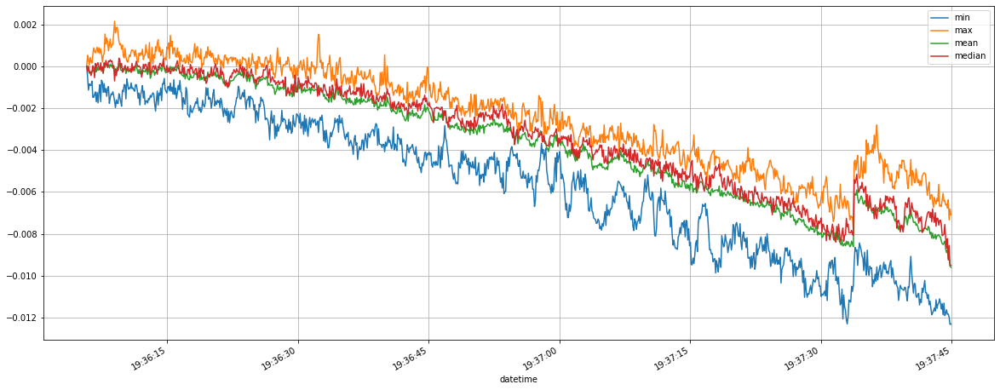

In [ ]:
df_dic.plot('datetime',['min', 'max', 'mean', 'median'],figsize=(20,8),grid=True)

In [ ]:
failure_time = pd.to_datetime('2022-12-19 19:37:35')

fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
failure_time_aprox = pd.to_datetime('2022-12-19 19:38:00')
t_load, t_dic, t_bot, t_top = failure_times(df_load, df_dic, phy_bot, phy_top, failure_time_aprox)
print('',t_load,'\n', t_dic,'\n', t_bot,'\n', t_top)

 2022-12-19T19:37:32.223982000 
 2022-12-19T19:37:33.832202000 
 2022-12-19 19:37:37.569652200 
 2022-12-19 19:37:33.314172600


In [ ]:
t_l_dic = get_seconds(t_load,t_dic)
t_l_bot = get_seconds(t_load,t_bot)
t_l_top = get_seconds(t_load,t_top)
print(t_l_dic,t_l_bot,t_l_top)

-1.60822 -5.345671 -1.090191


In [ ]:
df_dic.datetime = df_dic.datetime + pd.to_timedelta(t_l_dic,'s')
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(t_l_bot,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(t_l_top,'s')

In [ ]:
failure_time = pd.to_datetime('2022-12-19 19:37:35')

fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
df = mergeData(df_load, phy_bot, phy_top, df_dic)
df

,datetime,MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),Bottom Plane Inclination (deg),Top Plane Inclination (deg),min,max,mean,median
0,2022-12-19 19:33:52.223982000,6.158547,7.451777,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-12-19 19:33:52.323982000,5.414971,8.222265,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-12-19 19:33:52.423982000,5.200750,8.875023,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-12-19 19:33:52.523982000,5.242556,8.086274,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-12-19 19:34:37.223981188,5.353343,9.438881,95.809235,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
8468,2022-12-19 19:44:48.723981600,3.839979,64.925103,97.860847,127.182699,NaN,NaN,NaN,NaN
8469,2022-12-19 19:44:49.223981600,3.839979,64.925103,97.860847,118.449061,NaN,NaN,NaN,NaN
8470,2022-12-19 19:44:49.723981600,3.839979,64.925103,97.860847,106.345537,NaN,NaN,NaN,NaN
8471,2022-12-19 19:44:50.223981600,3.839979,64.925103,97.860847,99.500625,NaN,NaN,NaN,NaN


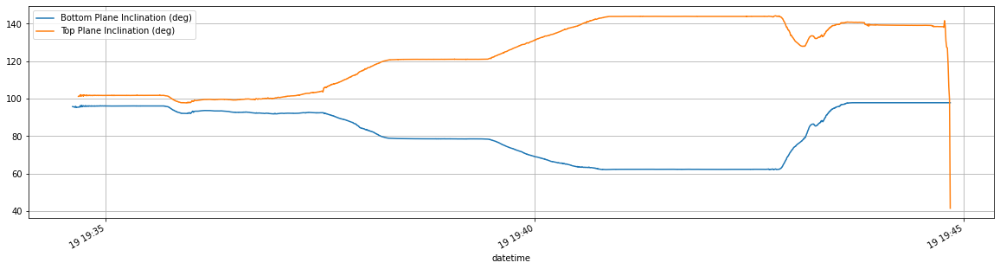

In [ ]:
df.plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

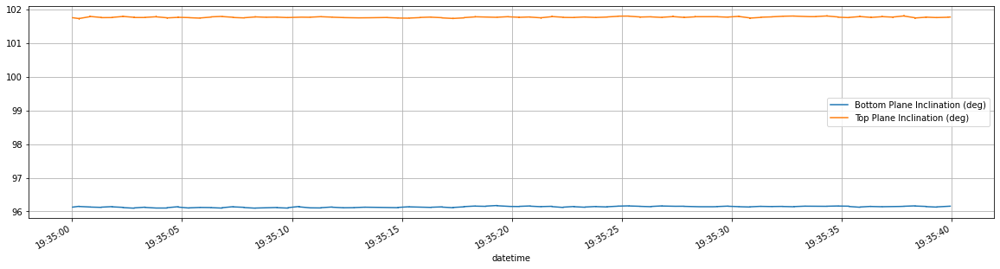

In [ ]:
df[(df.datetime>pd.to_datetime('2022-12-19 19:35:00'))&(df.datetime<pd.to_datetime('2022-12-19 19:35:40'))].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

In [ ]:
bot_ini = df[(df.datetime>pd.to_datetime('2022-12-19 19:35:00'))&(df.datetime<pd.to_datetime('2022-12-19 19:35:40'))]['Bottom Plane Inclination (deg)'].mean()
top_ini = df[(df.datetime>pd.to_datetime('2022-12-19 19:35:00'))&(df.datetime<pd.to_datetime('2022-12-19 19:35:40'))]['Top Plane Inclination (deg)'].mean()
df['rotation_deg'] = df['Top Plane Inclination (deg)'] - (df['Bottom Plane Inclination (deg)'] + (top_ini-bot_ini))

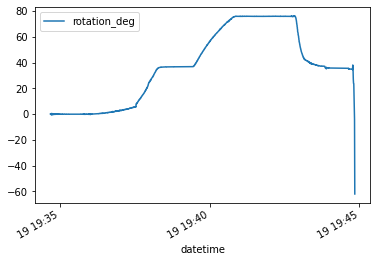

In [ ]:
df[~pd.isnull(df['rotation_deg'])].plot('datetime','rotation_deg')

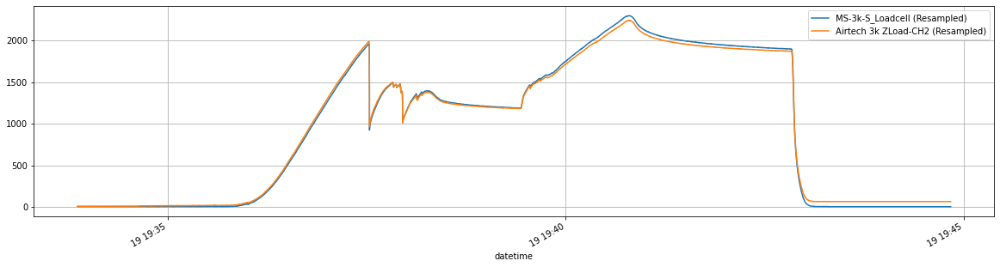

In [ ]:
df.plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

In [ ]:
fig = px.line(df[(df.datetime>=pd.to_datetime('2022-12-19 19:35:40'))&(df.datetime<=pd.to_datetime('2022-12-19 19:40:40'))],'rotation_deg','MS-3k-S_Loadcell (Resampled)')
fig.show()

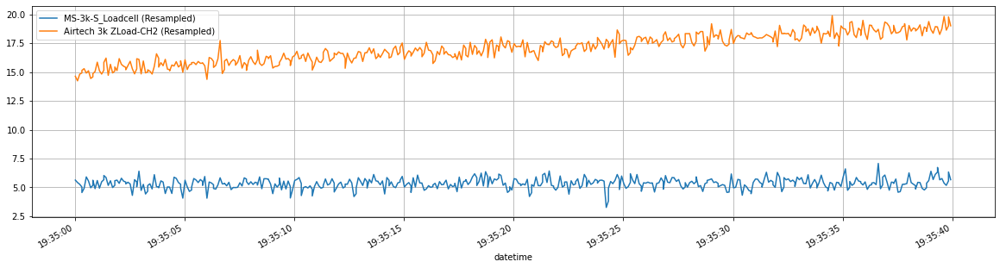

In [ ]:
df[(df.datetime>pd.to_datetime('2022-12-19 19:35:00'))&(df.datetime<pd.to_datetime('2022-12-19 19:35:40'))].plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

In [ ]:
air_ini_load = df.loc[df.datetime>=pd.to_datetime('2022-12-19 19:35:38'),'Airtech 3k ZLoad-CH2 (Resampled)'].values[0]
ms_ini_load = df.loc[(df.datetime>pd.to_datetime('2022-12-19 19:35:00'))&(df.datetime<pd.to_datetime('2022-12-19 19:35:40')),'MS-3k-S_Loadcell (Resampled)'].mean()
print(air_ini_load,ms_ini_load)

19.025826 5.348370759425494


In [ ]:
df_diameters[:3]

,ID Culm,Internode,D1 (in) N-S,D1 (in) E-W,D2 (in) N-S,D2 (in) E-W,D3 (in) N-S,D3 (in) E-W,D (in) Avg.,Phy_bot,Phy_top,s (in),MC (%),Date,Observations
0,2,1,2.79,2.76,2.77,2.72,2.77,2.70,2.75,ok,ok,6.5000,12.7,12/19/2022 19:46,worm clamp got broken
1,2,2,2.80,2.80,2.81,2.76,2.81,2.74,2.79,ok,ok,8.3125,11.6,12/20/2022 11:22,NaN
2,2,4,2.94,2.87,2.92,2.84,2.85,2.83,2.88,ok,ok,14.3750,12.2,11/23/2022 19:28,phy bot failed


In [ ]:
df_DIC_info[2:4]

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
2,2_1,left_top,2022-12-19 23:41:40+00:00,387092117.0,NaN,NaN,NaN,-2.422607,715.0,425.0,880.0,561.0,bad dic - too far or some movements in the 50M...
3,2_1,rigth_top,2022-12-19 23:41:40+00:00,387092116.0,NaN,NaN,NaN,-1.856158,625.0,396.0,761.0,527.0,bad dic - too far or some movements in the 50M...


In [ ]:
OD_dict = df_diameters.T.to_dict()[0]
OD_dict

{'ID Culm': 2,
 'Internode': 1,
 'D1 (in) N-S': 2.79,
 'D1 (in) E-W': 2.76,
 'D2 (in) N-S': 2.77,
 'D2 (in) E-W': 2.72,
 'D3 (in) N-S': 2.77,
 'D3 (in) E-W': 2.7,
 'D (in) Avg.': 2.75,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 6.5,
 'MC (%)': 12.7,
 'Date': '12/19/2022 19:46',
 'Observations': 'worm clamp got broken'}

In [ ]:
df_ring_prop

,Unnamed: 0,outer_diameter_in,inner_diameter_in,bamboo_thickness_in,inner_diameter_min_in,inner_diameter_max_in,bamboo_thickness_min_in,bamboo_thickness_max_in,a1,a2,...,y_in,Ix_in4,Iy_in4,J_in4,Ac_in2,Pc_in,Jc_in4,Fiber Density,path,image_name
0,0,2.836204,2.260250,0.287977,2.231667,2.303333,0.276667,0.301667,[44.0],"[94.0, 100.0]",...,1.443004,1.893902,1.861866,3.755768,5.066406,8.423958,3.509953,0.422381,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_cropped2_cleaned.jpg
1,1,2.672407,1.528815,0.571796,1.472500,1.587500,0.538333,0.612500,[164.0],"[82.0, 88.0]",...,1.344267,2.234182,2.202727,4.436908,3.411049,6.939613,3.834794,0.425178,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_0_T_cropped2_cleaned.jpg
2,2,2.778870,1.768315,0.505278,1.726667,1.829167,0.472500,0.557500,[32.0],"[112.0, 114.0]",...,1.396439,2.439946,2.364838,4.804784,3.999264,7.493278,4.313983,0.409211,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_1_T_cropped2_cleaned.jpg
3,3,2.632269,2.107972,0.262148,2.068333,2.145000,0.237500,0.295000,[30.0],"[140.0, 142.0]",...,1.299785,1.373754,1.347543,2.721297,4.360488,7.820182,2.549529,0.393438,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_11_T_cropped2_cleaned.jpg
4,4,2.555954,2.077454,0.239250,2.057500,2.100833,0.218333,0.274167,[110.0],[32.0],...,1.281734,1.167872,1.154058,2.321931,4.166139,7.654870,2.169909,0.402110,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_12_4_T_cropped2_cleaned.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,159,2.873259,2.294954,0.289153,2.177500,2.381667,0.244167,0.318333,[174.0],"[94.0, 96.0]",...,1.462685,2.100084,1.863005,3.963089,5.187193,8.535110,3.646222,0.388638,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_9_1_T_cropped3_cleaned.jpg
160,160,2.624880,2.112778,0.256051,2.081667,2.150000,0.239167,0.275833,"[10.0, 12.0, 14.0]",[120.0],...,1.306997,1.354710,1.355202,2.709912,4.367757,7.853920,2.487808,0.398736,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_12_1_T_cropped6_cleaned.jpg
161,161,3.056037,2.304481,0.375778,2.275000,2.335833,0.349167,0.403333,[118.0],[20.0],...,1.508281,2.878856,2.874245,5.753101,5.581124,8.897812,5.262005,0.386125,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_3_5_3_B_cropped6_cleaned.jpg
162,162,2.714981,2.164537,0.275222,2.128333,2.205000,0.255000,0.297500,"[66.0, 68.0]","[138.0, 140.0]",...,1.339552,1.559862,1.577974,3.137836,4.635900,8.082190,2.927403,0.413979,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_10_T_cropped6_cleaned.jpg


In [ ]:
printMatch(df_ring_prop.image_name,'_2_1_')

2 T scans_2_1_T_cropped2_cleaned.jpg
42 B scans_2_1_B_cropped2_cleaned.jpg


In [ ]:
df_ring_prop.loc[df_ring_prop.index.isin([2,42]),df_ring_prop.columns].T

,2,42
outer_diameter_in,2.77887,2.798917
inner_diameter_in,1.768315,1.702454
bamboo_thickness_in,0.505278,0.548231
inner_diameter_min_in,1.726667,1.650833
inner_diameter_max_in,1.829167,1.7625
bamboo_thickness_min_in,0.4725,0.51
bamboo_thickness_max_in,0.5575,0.58
a1,[32.0],[90.0]
a2,"[112.0, 114.0]",[14.0]
a3,[298.0],"[252.0, 254.0]"


In [ ]:
J_in4 = df_ring_prop.loc[df_ring_prop.index.isin([2,42]),'J_in4'].mean()
J_in4

4.97515477170633

In [ ]:
ring_dict = df_ring_prop.T.to_dict()[42]
ring_dict

{'outer_diameter_in': 2.7989166666666665,
 'inner_diameter_in': 1.7024537037037035,
 'bamboo_thickness_in': 0.5482314814814815,
 'inner_diameter_min_in': 1.6508333333333334,
 'inner_diameter_max_in': 1.7625,
 'bamboo_thickness_min_in': 0.51,
 'bamboo_thickness_max_in': 0.58,
 'a1': '[90.0]',
 'a2': '[14.0]',
 'a3': '[252.0, 254.0]',
 'a4': '[40.0]',
 'area_in2': 3.881271527777778,
 'x_px': 1690.8154490465342,
 'x_in': 1.4090128742054453,
 'y_px': 1646.128789766956,
 'y_in': 1.3717739914724634,
 'Ix_in4': 2.525645156384953,
 'Iy_in4': 2.619880327626297,
 'J_in4': 5.14552548401125,
 'Ac_in2': 3.910786111111112,
 'Pc_in': 7.425357924501101,
 'Jc_in4': 4.516839903584408,
 'Fiber Density': 0.4398671254462535,
 'path': '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_2_1_B_cropped2_cleaned.jpg',
 'image_name': 'B scans_2_1_B_cropped2_cleaned.jpg'}

In [ ]:
ring_dict['outer_diameter_in']

2.7989166666666665

In [ ]:
OD = np.mean([ring_dict['outer_diameter_in'],OD_dict['D1 (in) N-S'],OD_dict['D1 (in) E-W']])
OD

2.782972222222222

In [ ]:
OD_mid = np.mean([OD_dict['D2 (in) N-S'],OD_dict['D2 (in) E-W']])
OD_mid

2.745

In [ ]:
df.columns

Index(['datetime', 'MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)', 'Bottom Plane Inclination (deg)',
       'Top Plane Inclination (deg)', 'min', 'max', 'mean', 'median',
       'rotation_deg', 'T_ms (kip-in)', '$\tau (ksi)$', '$\gamma_{phones}$',
       '$\gamma_{DIC}$'],
      dtype='object')

In [ ]:
df['T_ms (kip-in)'] = (df['MS-3k-S_Loadcell (Resampled)']-ms_ini_load)/1000 * (OD+wire_rope_D)
df['$\\tau (ksi)$'] = df['T_ms (kip-in)'] * OD/2 / J_in4
df['$\gamma_{phones}$'] = np.deg2rad(df['rotation_deg']) *  OD_mid/2 / OD_dict['s (in)']
df['$\gamma_{DIC}$'] = df['mean'] if df['mean'].mean() > 0 else - df['mean']

In [ ]:
all_data_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/2_1_Merged_Data.csv'
df.to_csv(all_data_path,index=False)

In [ ]:
fig1 = px.scatter(df[(df.datetime>=pd.to_datetime('2022-12-19 19:35:40'))&(df.datetime<=pd.to_datetime('2022-12-19 19:37:32'))],'$\gamma_{phones}$','$\\tau (ksi)$')
fig1.show()

In [ ]:
fig2 = px.scatter(df[(df.datetime>=pd.to_datetime('2022-12-19 19:35:40'))&(df.datetime<=pd.to_datetime('2022-12-19 19:37:32'))],'$\gamma_{DIC}$','$\\tau (ksi)$')
fig2.show()

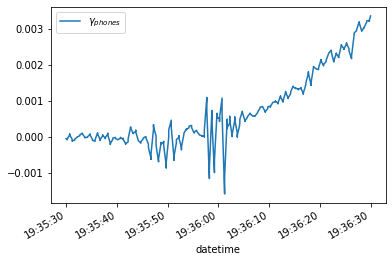

In [ ]:
df[(df.datetime<pd.to_datetime('2022-12-19T19:36:30'))&(df.datetime>pd.to_datetime('2022-12-19T19:35:30'))].plot('datetime','$\gamma_{phones}$')

In [ ]:
def ODR_results(df, start_time, end_time, fig_show=True, title=None, colors=None, min_max = (0.15,0.5)):
    """
    Regression using Orthogonal Distance Regression method.
    resources: https://github.com/plotly/plotly.py/issues/2345#issuecomment-858396014
    :param df:  dataframe with merged data.
    :param title: optional.
    :return: plotly figure and a and b constants of the equation y = ax + b
    """
    start_time = start_time if type(start_time) != str else pd.to_datetime(start_time)
    end_time = end_time if type(end_time) != str else pd.to_datetime(end_time)
    cols = [col for col in df.columns if col in ['$\gamma_{DIC}$', '$\gamma_{phones}$']]
    if not colors:
        # colors = px.colors.sequential.thermal
        colors = px.colors.qualitative.Pastel
    df = df.loc[(df.datetime >= start_time) & (df.datetime <= end_time), ['$\\tau (ksi)$'] + cols]
    df.reset_index(drop=True, inplace=True)
    max_tau = df['$\\tau (ksi)$'].max()
    fig = px.scatter(df, cols, '$\\tau (ksi)$', color_discrete_sequence=colors, opacity=1)
    fig.update_traces(marker=dict(size=4))  # ,line=dict(width=2,color=colors)
    fig.update_layout(template='plotly_white', font_family='Times New Roman', margin=dict(l=5, r=10, t=10, b=0),
                      xaxis=dict(title='$\gamma$'), legend_title="", yaxis_range=[0, max_tau],
                      legend=dict(yanchor="top", y=1, xanchor="left", x=0))  # height=400, width=900,
    # trendlines
    frm = int(len(df) * min_max[0])
    to = int(len(df) * min_max[1])
    G = []
    for i, col in enumerate(cols):
        df_c = df[~pd.isnull(df[col])]
        x = df_c.loc[frm:to, col].to_numpy()
        y = df_c.loc[frm:to, '$\\tau (ksi)$'].to_numpy()
        data = odr.Data(x, y)
        odr_obj = odr.ODR(data, odr.unilinear)
        output = odr_obj.run()
        a, b = output.beta
        x = np.linspace(0, (max_tau - b) / a, 100)
        fig.add_trace(go.Scattergl(x=x, y=x * a + b, mode='lines', name=f'$\\tau={b:.3f}+{a:.3f}\gamma$',
                                   line={'width': 1, 'dash': ['dash', 'dashdot'][i], 'color': px.colors.sequential.gray[
                                       i * 4]}))  # ['dash', 'dashdot', 'dot', 'longdash', 'longdashdot','solid']
        G.append(a)
    if title:
        fig.update_layout(title=title)
    if fig_show:
        fig.show()
    return fig, G

In [ ]:
start_time = '2022-12-19 19:36:02'
end_time = '2022-12-19 19:37:32.22'
fig, G = ODR_results(df,start_time,end_time)

In [ ]:
start_time = '2022-12-19 19:36:02'
end_time = '2022-12-19 19:37:32.22'
fig, G = ODR_results(df,start_time,end_time)

In [ ]:
strain_stress = '/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/2_1_Strain_Stress.pdf'
fig.write_image(strain_stress, width=700, height=450, scale=3)

In [ ]:
G

[108.83443421851281, 245.53665697752996]

In [ ]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(5,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(5,'s')),'$\\tau (ksi)$'].max()

1.610328849641054

In [ ]:
printMatch(ring_fib_paths,'_2_1_')

2 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/T scans_2_1_T_cropped2_cleaned_r10_w20_fiber_density.csv
42 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/B scans_2_1_B_cropped2_cleaned_r10_w20_fiber_density.csv


In [ ]:
printMatch(ring_img_paths,'_2_1_')

2 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_2_1_T_cropped2_cleaned.jpg
42 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_2_1_B_cropped2_cleaned.jpg


In [ ]:
df_fib = pd.read_csv(ring_fib_paths[2])


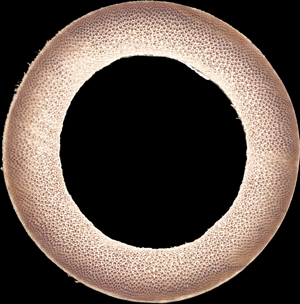

In [ ]:
fig = plotRing(df_fib,ring_img_paths[2],300)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/2_1_Fiber_density_Top.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

In [ ]:
df_fib = pd.read_csv(ring_fib_paths[42])


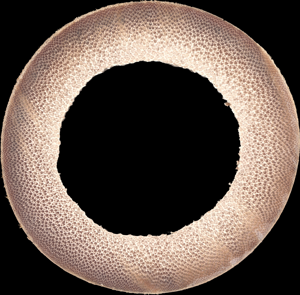

In [ ]:
fig = plotRing(df_fib,ring_img_paths[42],300)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/2_1_Fiber_density_Bottom.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

## Sample 2.2

In [ ]:
printMatch(phy_folders,'2_2')

1 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/2_2


In [ ]:
folders = glob.glob(phy_folders[1]+'/*')
folders

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/2_2/Inclination 2022-12-20_2.2_bottom',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/2_2/Inclination 2022-12-20_2.2_top']

In [ ]:
phy_bot, phy_top = phy_bot_top(folders)

In [ ]:
printMatch(load_cell_paths,'2_2')

12 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/2_2.lvm


In [ ]:
df_load = read_lvm(load_cell_paths[12])
df_load

,X_Value,MTS-Force-New (Resampled),MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),datetime
0,0.0,-13444.346868,5.564897,363.084149,2022-12-20 11:41:34.689340
1,0.1,-13443.313567,4.868702,362.859259,2022-12-20 11:41:34.789340
2,0.2,-13442.147978,4.131470,362.414381,2022-12-20 11:41:34.889340
3,0.3,-13440.929810,4.440932,361.755280,2022-12-20 11:41:34.989340
4,99.2,-13419.156688,4.691963,365.941309,2022-12-20 11:43:13.889340
...,...,...,...,...,...
2346,333.4,-12992.069550,5.408244,375.624073,2022-12-20 11:47:08.089340
2347,333.5,-12992.175633,4.136563,375.780631,2022-12-20 11:47:08.189340
2348,333.6,-12991.380871,4.511090,376.438097,2022-12-20 11:47:08.289340
2349,333.7,-12990.851383,5.258126,376.226566,2022-12-20 11:47:08.389340


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '2_2']

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
4,2_2,rigth_top,2022-12-20 15:46:42+00:00,209287605.0,NaN,NaN,NaN,-0.795724,609.0,367.0,829.0,553.0,good results
5,2_2,left_top,2022-12-20 15:46:42+00:00,209287604.0,NaN,NaN,NaN,-0.473508,715.0,384.0,967.0,582.0,not too good rotation on the cropped images/di...


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '2_2'].comment.values

array(['good results',
       'not too good rotation on the cropped images/disparity on mins and maxs'],
      dtype=object)

In [ ]:
printMatch(DIC_paths,'2_2')

3 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/2_2_DIC_right.csv
4 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/2_2_DIC_left.csv


In [ ]:
df_dic = loadDIC(DIC_paths[3],df_DIC_info,'2_2','r','lastFrame')
df_dic

,microSeconds,min,max,mean,median,datetime
0,19389588.0,0.000000,0.000000,0.000000,0.000000,2022-12-20 11:43:32.101983000
1,19489533.0,-0.000111,0.000417,0.000124,0.000095,2022-12-20 11:43:32.201928000
2,19589480.0,-0.000422,0.000514,0.000039,0.000031,2022-12-20 11:43:32.301875000
3,19689426.0,-0.000868,0.000525,-0.000104,-0.000036,2022-12-20 11:43:32.401821000
4,19789372.0,-0.000116,0.000673,0.000259,0.000241,2022-12-20 11:43:32.501767000
...,...,...,...,...,...,...
1186,137925929.0,-0.007796,-0.006346,-0.006881,-0.006691,2022-12-20 11:45:30.638324000
1187,138025875.0,-0.006870,-0.006337,-0.006615,-0.006627,2022-12-20 11:45:30.738270000
1188,138125821.0,-0.007085,-0.006160,-0.006720,-0.006818,2022-12-20 11:45:30.838215999
1189,138225767.0,-0.007603,-0.005832,-0.006847,-0.006976,2022-12-20 11:45:30.938162000


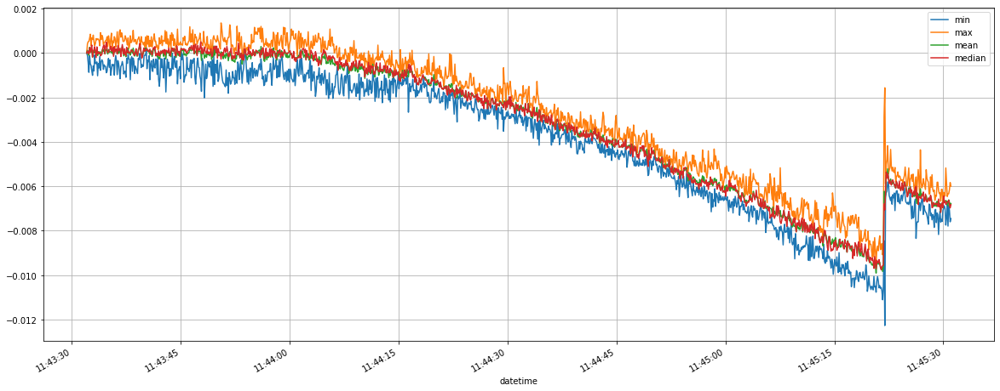

In [ ]:
df_dic.plot('datetime',['min', 'max', 'mean', 'median'],figsize=(20,8),grid=True)

In [ ]:
df_dic.datetime[500]

Timestamp('2022-12-20 11:44:22.075145')

In [ ]:
failure_time = pd.to_datetime('2022-12-20 11:45:30')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig.show()

In [ ]:
failure_time_aprox = pd.to_datetime('2022-12-20 11:45:22')
t_load, t_dic, t_bot, t_top = failure_times(df_load, df_dic, phy_bot, phy_top, failure_time_aprox)
print('',t_load,'\n', t_dic,'\n', t_bot,'\n', t_top)

 2022-12-20T11:45:21.089340000 
 2022-12-20T11:45:21.843046999 
 2022-12-20 11:45:22.306648100 
 2022-12-20 11:45:28.486936800


In [ ]:
t_l_dic = get_seconds(t_load,t_dic)
t_l_bot = get_seconds(t_load,t_bot)
t_l_top = get_seconds(t_load,t_top)
print(t_l_dic,t_l_bot,t_l_top)

-0.753706999 -1.217309 -7.397597


In [ ]:
df_dic.datetime = df_dic.datetime + pd.to_timedelta(t_l_dic,'s')
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(t_l_bot,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(t_l_top,'s')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig.show()

In [ ]:
df = mergeData(df_load, phy_bot, phy_top, df_dic)
df

,datetime,MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),Bottom Plane Inclination (deg),Top Plane Inclination (deg),min,max,mean,median
0,2022-12-20 11:41:34.689340000,5.564897,363.084149,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-12-20 11:41:34.789340000,4.868702,362.859259,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-12-20 11:41:34.889340000,4.131470,362.414381,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-12-20 11:41:34.989340000,4.440932,361.755280,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-12-20 11:42:42.589339125,4.443096,361.791366,175.025296,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4485,2022-12-20 11:47:08.089340000,5.408244,375.624073,NaN,NaN,NaN,NaN,NaN,NaN
4486,2022-12-20 11:47:08.189340000,4.136563,375.780631,NaN,NaN,NaN,NaN,NaN,NaN
4487,2022-12-20 11:47:08.289340000,4.511090,376.438097,NaN,NaN,NaN,NaN,NaN,NaN
4488,2022-12-20 11:47:08.389340000,5.258126,376.226566,NaN,NaN,NaN,NaN,NaN,NaN


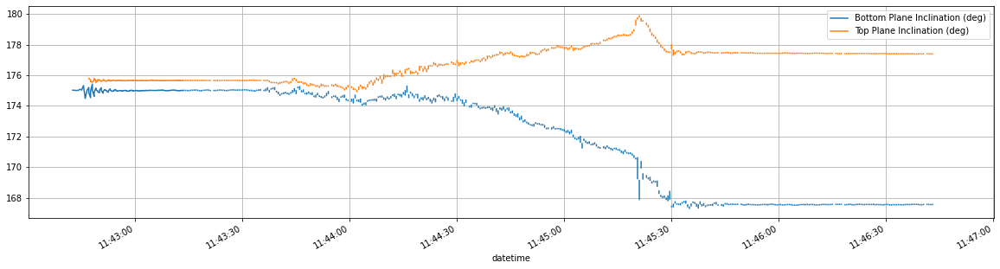

In [ ]:
df.plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

<ipython-input-65-a22514117192>:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



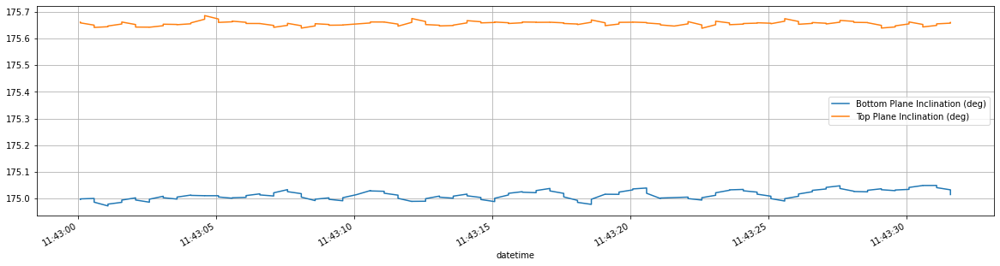

In [ ]:
ini = pd.to_datetime('2022-12-20 11:43:00')
fin = pd.to_datetime('2022-12-20 11:43:32')
df[~pd.isnull(df['Bottom Plane Inclination (deg)'])][(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

In [ ]:
bot_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Bottom Plane Inclination (deg)'].mean()
top_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Top Plane Inclination (deg)'].mean()
df['rotation_deg'] = df['Top Plane Inclination (deg)'] - (df['Bottom Plane Inclination (deg)'] + (top_ini-bot_ini))

<ipython-input-69-f66e8c1cdbfe>:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



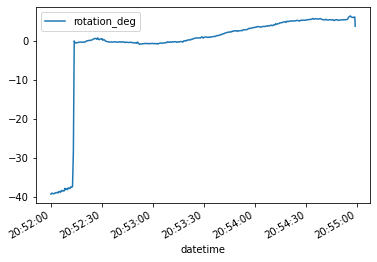

In [ ]:
ini = pd.to_datetime('2022-12-19 20:52:00')
fin = pd.to_datetime('2022-12-19 20:54:59')
df[(df.datetime>ini)&(df.datetime<fin)][~pd.isnull(df['rotation_deg'])].plot('datetime','rotation_deg')

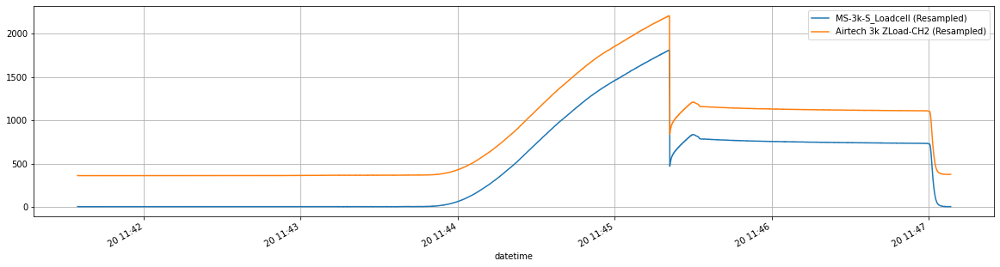

In [ ]:
df.plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

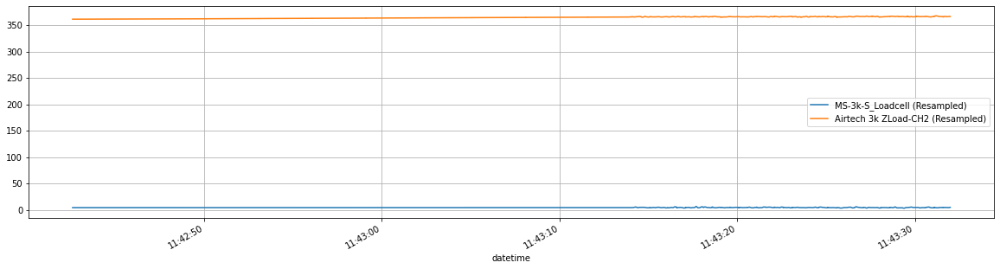

In [ ]:
ini = pd.to_datetime('2022-12-20 11:42:00')
fin = pd.to_datetime('2022-12-20 11:43:32')
df[(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

In [ ]:
air_ini_load = df.loc[df.datetime>=fin,'Airtech 3k ZLoad-CH2 (Resampled)'].values[0]
ms_ini_load = df.loc[(df.datetime>ini)&(df.datetime<fin),'MS-3k-S_Loadcell (Resampled)'].mean()
print(air_ini_load,ms_ini_load)

366.977894 4.629972321333334


In [ ]:
df_diameters[1:5]

,ID Culm,Internode,D1 (in) N-S,D1 (in) E-W,D2 (in) N-S,D2 (in) E-W,D3 (in) N-S,D3 (in) E-W,D (in) Avg.,Phy_bot,Phy_top,s (in),MC (%),Date,Observations
1,2,2,2.80,2.80,2.81,2.76,2.81,2.74,2.79,ok,ok,8.3125,11.6,12/20/2022 11:22,NaN
2,2,4,2.94,2.87,2.92,2.84,2.85,2.83,2.88,ok,ok,14.3750,12.2,11/23/2022 19:28,phy bot failed
3,2,5,2.97,2.87,2.96,2.86,2.93,2.81,2.90,ok,ok,14.6875,11.6,11/23/2022 20:49,NaN
4,2,6,2.94,2.88,2.95,2.86,2.88,2.82,2.89,ok,ok,16.5000,11.3,11/23/2022 18:38,backwards


In [ ]:
OD_dict = df_diameters.T.to_dict()[1]
OD_dict

{'ID Culm': 2,
 'Internode': 2,
 'D1 (in) N-S': 2.8,
 'D1 (in) E-W': 2.8,
 'D2 (in) N-S': 2.81,
 'D2 (in) E-W': 2.76,
 'D3 (in) N-S': 2.81,
 'D3 (in) E-W': 2.74,
 'D (in) Avg.': 2.79,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 8.3125,
 'MC (%)': 11.6,
 'Date': '12/20/2022 11:22',
 'Observations': nan}

In [ ]:
df_ring_prop

,Unnamed: 0,outer_diameter_in,inner_diameter_in,bamboo_thickness_in,inner_diameter_min_in,inner_diameter_max_in,bamboo_thickness_min_in,bamboo_thickness_max_in,a1,a2,...,y_in,Ix_in4,Iy_in4,J_in4,Ac_in2,Pc_in,Jc_in4,Fiber Density,path,image_name
0,0,2.836204,2.260250,0.287977,2.231667,2.303333,0.276667,0.301667,[44.0],"[94.0, 100.0]",...,1.443004,1.893902,1.861866,3.755768,5.066406,8.423958,3.509953,0.422381,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_cropped2_cleaned.jpg
1,1,2.672407,1.528815,0.571796,1.472500,1.587500,0.538333,0.612500,[164.0],"[82.0, 88.0]",...,1.344267,2.234182,2.202727,4.436908,3.411049,6.939613,3.834794,0.425178,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_0_T_cropped2_cleaned.jpg
2,2,2.778870,1.768315,0.505278,1.726667,1.829167,0.472500,0.557500,[32.0],"[112.0, 114.0]",...,1.396439,2.439946,2.364838,4.804784,3.999264,7.493278,4.313983,0.409211,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_1_T_cropped2_cleaned.jpg
3,3,2.632269,2.107972,0.262148,2.068333,2.145000,0.237500,0.295000,[30.0],"[140.0, 142.0]",...,1.299785,1.373754,1.347543,2.721297,4.360488,7.820182,2.549529,0.393438,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_11_T_cropped2_cleaned.jpg
4,4,2.555954,2.077454,0.239250,2.057500,2.100833,0.218333,0.274167,[110.0],[32.0],...,1.281734,1.167872,1.154058,2.321931,4.166139,7.654870,2.169909,0.402110,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_12_4_T_cropped2_cleaned.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,159,2.873259,2.294954,0.289153,2.177500,2.381667,0.244167,0.318333,[174.0],"[94.0, 96.0]",...,1.462685,2.100084,1.863005,3.963089,5.187193,8.535110,3.646222,0.388638,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_9_1_T_cropped3_cleaned.jpg
160,160,2.624880,2.112778,0.256051,2.081667,2.150000,0.239167,0.275833,"[10.0, 12.0, 14.0]",[120.0],...,1.306997,1.354710,1.355202,2.709912,4.367757,7.853920,2.487808,0.398736,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_12_1_T_cropped6_cleaned.jpg
161,161,3.056037,2.304481,0.375778,2.275000,2.335833,0.349167,0.403333,[118.0],[20.0],...,1.508281,2.878856,2.874245,5.753101,5.581124,8.897812,5.262005,0.386125,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_3_5_3_B_cropped6_cleaned.jpg
162,162,2.714981,2.164537,0.275222,2.128333,2.205000,0.255000,0.297500,"[66.0, 68.0]","[138.0, 140.0]",...,1.339552,1.559862,1.577974,3.137836,4.635900,8.082190,2.927403,0.413979,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_10_T_cropped6_cleaned.jpg


In [ ]:
printMatch(df_ring_prop.image_name,'_2_2_')

12 T scans_2_2_T_cropped2_cleaned.jpg
52 B scans_2_2_B_cropped2_cleaned.jpg


In [ ]:
df_ring_prop.loc[df_ring_prop.index.isin([12,52]),df_ring_prop.columns].T

,12,52
outer_diameter_in,2.800148,2.843
inner_diameter_in,1.928435,1.876593
bamboo_thickness_in,0.435856,0.483204
inner_diameter_min_in,1.866667,1.78
inner_diameter_max_in,1.995,1.9575
bamboo_thickness_min_in,0.409167,0.440833
bamboo_thickness_max_in,0.469167,0.525833
a1,"[34.0, 36.0]",[10.0]
a2,"[112.0, 114.0]",[128.0]
a3,[96.0],"[152.0, 154.0]"


In [ ]:
J_in4 = df_ring_prop.loc[df_ring_prop.index.isin([12,52]),'J_in4'].mean()
J_in4

4.890359374271105

In [ ]:
ring_dict = df_ring_prop.T.to_dict()[52]
ring_dict

{'outer_diameter_in': 2.8429999999999995,
 'inner_diameter_in': 1.8765925925925924,
 'bamboo_thickness_in': 0.4832037037037037,
 'inner_diameter_min_in': 1.78,
 'inner_diameter_max_in': 1.9575,
 'bamboo_thickness_min_in': 0.4408333333333333,
 'bamboo_thickness_max_in': 0.5258333333333334,
 'a1': '[10.0]',
 'a2': '[128.0]',
 'a3': '[152.0, 154.0]',
 'a4': '[340.0]',
 'area_in2': 3.595749305555556,
 'x_px': 1693.4333025163392,
 'x_in': 1.411194418763616,
 'y_px': 1748.671706696893,
 'y_in': 1.4572264222474105,
 'Ix_in4': 2.65404245276686,
 'Iy_in4': 2.502054727196024,
 'J_in4': 5.156097179962884,
 'Ac_in2': 4.312616319444445,
 'Pc_in': 7.799693845907847,
 'Jc_in4': 4.608868676605127,
 'Fiber Density': 0.445441849838515,
 'path': '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_2_2_B_cropped2_cleaned.jpg',
 'image_name': 'B scans_2_2_B_cropped2_cleaned.jpg'}

In [ ]:
OD = np.mean([ring_dict['outer_diameter_in'],OD_dict['D1 (in) N-S'],OD_dict['D1 (in) E-W']])
OD

2.8143333333333325

In [ ]:
OD_mid = np.mean([OD_dict['D2 (in) N-S'],OD_dict['D2 (in) E-W']])
OD_mid

2.785

In [ ]:
df['T_ms (kip-in)'] = (df['MS-3k-S_Loadcell (Resampled)']-ms_ini_load)/1000 * (OD+wire_rope_D)
df['$\\tau (ksi)$'] = df['T_ms (kip-in)'] * OD/2 / J_in4
df['$\gamma_{phones}$'] = np.deg2rad(df['rotation_deg']) *  OD_mid/2 / OD_dict['s (in)']
df['$\gamma_{DIC}$'] = df['mean'] if df['mean'].mean() > 0 else - df['mean']

In [ ]:
all_data_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/2_2_Merged_Data.csv'
df.to_csv(all_data_path,index=False)

In [ ]:
fin

Timestamp('2022-12-20 11:43:32')

<ipython-input-80-8d537fe43596>:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



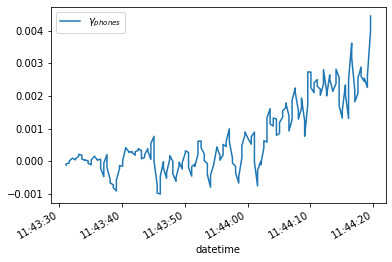

In [ ]:
df[~pd.isnull(df['$\gamma_{phones}$'])][(df.datetime>=pd.to_datetime('2022-12-20 11:43:31'))&(df.datetime<=pd.to_datetime('2022-12-20 11:44:20'))].plot('datetime','$\gamma_{phones}$')

In [ ]:
t_load

numpy.datetime64('2022-12-20T11:45:21.089340000')

In [ ]:
start_time = '2022-12-20 11:43:52.5'
end_time = '2022-12-20 11:45:21.2'
fig, G = ODR_results(df,start_time,end_time,min_max=(.1,.55))

In [ ]:
strain_stress = '/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/2_2_Strain_Stress.pdf'
fig.write_image(strain_stress, width=700, height=450, scale=3)

In [ ]:
G

[114.48993944496345, 239.3359458139665]

In [ ]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(5,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(5,'s')),'$\\tau (ksi)$'].max()

1.545848752776764

In [ ]:
printMatch(ring_fib_paths,'_2_2_')

12 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/T scans_2_2_T_cropped2_cleaned_r10_w20_fiber_density.csv
52 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/B scans_2_2_B_cropped2_cleaned_r10_w20_fiber_density.csv


In [ ]:
printMatch(ring_img_paths,'_2_2_')

12 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_2_2_T_cropped2_cleaned.jpg
52 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_2_2_B_cropped2_cleaned.jpg


In [ ]:
df_fib = pd.read_csv(ring_fib_paths[12])


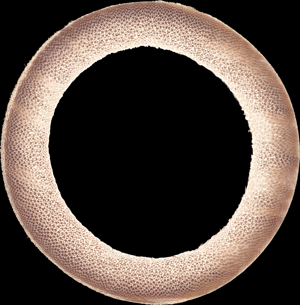

In [ ]:
fig = plotRing(df_fib,ring_img_paths[12],300)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/2_2_Fiber_density_Top.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

In [ ]:
# sample data in a pandas dataframe
np.random.seed(1)
df=pd.DataFrame(dict(A=np.random.uniform(low=-1, high=2, size=25).tolist(),
                    B=np.random.uniform(low=-4, high=3, size=25).tolist(),
                    C=np.random.uniform(low=-1, high=3, size=25).tolist(),
                    ))
df = df.cumsum()

# define colors as a list 
colors = px.colors.qualitative.Plotly

# convert plotly hex colors to rgba to enable transparency adjustments
def hex_rgba(hex, transparency):
    col_hex = hex.lstrip('#')
    col_rgb = list(int(col_hex[i:i+2], 16) for i in (0, 2, 4))
    col_rgb.extend([transparency])
    areacol = tuple(col_rgb)
    return areacol

rgba = [hex_rgba(c, transparency=0.2) for c in colors]
colCycle = ['rgba'+str(elem) for elem in rgba]

# Make sure the colors run in cycles if there are more lines than colors
def next_col(cols):
    while True:
        for col in cols:
            yield col
line_color=next_col(cols=colCycle)

# plotly  figure
fig = go.Figure()

# add line and shaded area for each series and standards deviation
for i, col in enumerate(df):
    new_col = next(line_color)
    x = list(df.index.values+1)
    y1 = df[col]
    y1_upper = [(y + np.std(df[col])) for y in df[col]]
    y1_lower = [(y - np.std(df[col])) for y in df[col]]
    y1_lower = y1_lower[::-1]

    # standard deviation area
    fig.add_traces(go.Scatter(x=x+x[::-1],
                                y=y1_upper+y1_lower,
                                fill='tozerox',
                                fillcolor=new_col,
                                line=dict(color='rgba(255,255,255,0)'),
                                showlegend=False,
                                name=col))

    # line trace
    fig.add_traces(go.Scatter(x=x,
                              y=y1,
                              line=dict(color=new_col, width=2.5),
                              mode='lines',
                              name=col)
                                )
# set x-axis
fig.update_layout(xaxis=dict(range=[1,len(df)]))

fig.show()

In [ ]:
def plotRing(df_fib, img_path, resize=200):
    """
    generate a plotly figure of the fiber density behavior with the image of the ring
    :param resize: the new size of the scan which is huge.
    :param df_fib: rings and wedges with fiber density results
    :param img_path: path of the scanned ring
    :return: plotly figure
    """
    df_fib.rename(columns={'density': 'Density (%)', 'wedge': 'Wedge'}, inplace=True)
    df_fib['t (%)'] = df_fib.ring / df_fib.ring.max()
    df_fib = df_fib[~df_fib.ring.isin([df_fib.ring.min(), df_fib.ring.max()])]
    fig = px.line(df_fib, x="t (%)", y="Density (%)", color='Wedge', template='plotly_white')
    img = Image.open(img_path)
    img_size = img.size
    r = resize / img_size[0]
    img = img.resize((resize, int(img_size[1] * r)))
    fig.add_layout_image(
        dict(
            source=img,
            x=0.95,
            y=.1,
        ))
    fig.update_layout_images(dict(
        xref="paper",
        yref="paper",
        sizex=0.30,
        sizey=0.30,
        xanchor="right",
        yanchor="bottom"
    ))

    fig.update_layout(font_family='Times New Roman', margin=dict(l=5, r=10, t=10, b=5))
    return fig

In [ ]:
df_fib = pd.read_csv(ring_fib_paths[52])


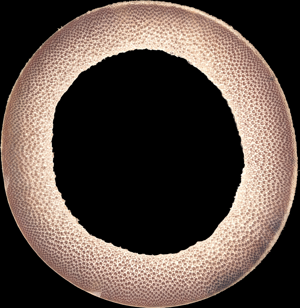

In [ ]:
fig = plotRing(df_fib,ring_img_paths[52],300)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/2_2_Fiber_density_Bottom.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

## Sample 3.2

In [ ]:
printMatch(phy_folders,'3_2')

12 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2
22 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_20


In [ ]:
folders = glob.glob(phy_folders[12]+'/*')
folders

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_bottom']

In [ ]:
def merge_phyphox_data(phyphox_data):
    '''
    from csv phyphox folder, independently sensor files are compiled in a dataframe
    param phyphox_data: list of sensor file paths or container folder path.
    '''
    if type(phyphox_data) == list:
        data_file_paths = phyphox_data
    else:
        data_file_paths = file_paths(phyphox_data)
    DF, dnames = [], ['Flat', 'Plane', 'Side', 'Upright']
    for file_path in data_file_paths[0:4]:
        bname = os.path.basename(file_path).split('.')[0]
        if bname in dnames:
            df = pd.read_csv(file_path)
            df.columns = [col if col == 't (s)' else bname + ' ' + col for col in df.columns]
            DF.append(df)
    if len(DF) > 0:
        df = pd.concat(DF, axis=1)
        df = df.T.drop_duplicates().T
    else:
        print('no dataframes')
    try:
        for path in data_file_paths:
            if 'time' in path:
                df_t = pd.read_csv(path)
                print(path)
                start, end = None, None
                for i in df_t.index:
                    if 'START' in df_t.event[i]:
                        start = i
                        print('start:',start)
                    elif 'PAUSE' in df_t.event[i]:
                        end = i
                        print('end',end)
                    if start != None and end != None:
                        print('start,end:',start,end)
                        frm = df.index[df['t (s)'] > df_t['experiment time'][start]]#.tolist()
                        to = df.index[df['t (s)'] <= df_t['experiment time'][end]]#.tolist()
                        print('from:',frm[0])
                        print('to:', to[-1],'\n')
                        df.loc[frm[0]:to[-1], 'datetime'] = df_t['system time text'][start] #+ pd.to_timedelta(df.loc[frm[0]:to[-1], 't (s)'], unit='s')
                        df.loc[frm[0]:to[-1], 't'] = df.loc[frm[0]:to[-1], 't (s)'] - df_t['experiment time'][start]
                        start, end = None, None
                df['datetime'] = pd.to_datetime(df['datetime']) + pd.to_timedelta(df['t'], unit='s')
                df.datetime = df.datetime.dt.tz_localize(None)
                return df
        print('metadata file time.csv, not found.')
        return df
    except BaseException as err:
        print(f"Unexpected {err}, {type(err)}")
        return df

def phy_bot_top(folders, all_data=False):
    """
    helps to select which is bottom or top from folders
    :param all_data: if true returns all sensors' data, else returns just inclination data
    :param folders: folders of bottom and top results of phyphox of same test
    :return: dataframes of bottom and top readings
    """
    count = 0
    for folder in folders:
        if 'top' in os.path.basename(folder):
            phy_top = merge_phyphox_data(folder)
            count += 1
        if 'bot' in os.path.basename(folder):
            phy_bot = merge_phyphox_data(folder)
            count += 1
    if count != 2:
        raise Exception(f'Could not find bottom or top paths in {folders}')
    else:
        if all_data:
            return phy_bot, phy_top
        else:
            return phy_bot[['datetime'] + [col for col in phy_bot.columns if 'Plane Inclination' in col]], phy_top[
                ['datetime'] + [col for col in phy_top.columns if 'Plane Inclination' in col]]


In [ ]:
phy_bot, phy_top = phy_bot_top(folders,all_data=True)

/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/meta/time.csv
start: 0
end 1
start,end: 0 1
from: 0
to: 271 

start: 2
end 3
start,end: 2 3
from: 272
to: 981 

/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_bottom/meta/time.csv
start: 0
end 1
start,end: 0 1
from: 0
to: 1477 



In [ ]:
px.line(phy_bot,'datetime',phy_bot.columns[1:])

In [ ]:
px.line(phy_bot,'datetime',phy_bot.columns[1:-1])

In [ ]:
px.line(phy_top,'datetime',phy_top.columns[1:])

In [ ]:
px.scatter(phy_top,'datetime',phy_top.columns[1:])

In [ ]:
phy_top[phy_top.datetime>=pd.to_datetime('2022-12-19 20:51:04')]

,t (s),Upright Tilt up/down (deg),Upright Tilt left/right (deg),Plane Inclination (deg),Side Tilt up/down (deg),Side Tilt left/right (deg),Flat Tilt up/down (deg),Flat Tilt left/right (deg),datetime
269,136.518229,-54.636025,4.329882,144.558696,85.670118,-86.924104,144.636025,176.924104,2022-12-19 20:51:04.416229000
270,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
271,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
272,137.794317,-139.391295,174.981933,130.500013,-84.981933,-84.152497,-130.608705,174.152497,2022-12-19 20:51:05.692316900
273,138.294317,-139.368457,175.008467,130.523986,-85.008467,-84.188018,-130.631543,174.188018,2022-12-19 20:51:06.192316900
...,...,...,...,...,...,...,...,...,...
977,495.794317,131.917507,-92.713547,86.981486,-177.286453,176.978104,-41.917507,-86.978104,2022-12-19 20:57:03.692316900
978,496.294317,30.133734,-23.656927,62.001010,113.656927,127.041530,59.866266,-37.041530,2022-12-19 20:57:04.192316900
979,496.794317,17.491009,-11.469388,72.837558,101.469388,122.775707,72.508991,-32.775707,2022-12-19 20:57:04.692316900
980,497.294317,17.024603,-11.893896,73.320393,101.893896,124.522383,72.975397,-34.522383,2022-12-19 20:57:05.192316900


In [ ]:
phy_top[269:280]

,t (s),Upright Tilt up/down (deg),Upright Tilt left/right (deg),Plane Inclination (deg),Side Tilt up/down (deg),Side Tilt left/right (deg),Flat Tilt up/down (deg),Flat Tilt left/right (deg),datetime
269,136.518229,-54.636025,4.329882,144.558696,85.670118,-86.924104,144.636025,176.924104,2022-12-19 20:51:04.416229000
270,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
271,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
272,137.794317,-139.391295,174.981933,130.500013,-84.981933,-84.152497,-130.608705,174.152497,2022-12-19 20:51:05.692316900
273,138.294317,-139.368457,175.008467,130.523986,-85.008467,-84.188018,-130.631543,174.188018,2022-12-19 20:51:06.192316900
274,139.294317,-139.104047,175.052010,130.790119,-85.052010,-84.291786,-130.895953,174.291786,2022-12-19 20:51:07.192316900
275,139.794317,-139.047994,175.153268,130.850434,-85.153268,-84.419386,-130.952006,174.419386,2022-12-19 20:51:07.692316900
276,140.294317,-138.663864,175.191656,131.235984,-85.191656,-84.537476,-131.336136,174.537476,2022-12-19 20:51:08.192316900
277,140.794317,-138.767250,175.426642,131.142199,-85.426642,-84.785253,-131.232750,174.785253,2022-12-19 20:51:08.692316900
278,141.294317,-138.483430,175.519635,131.429556,-85.519635,-84.941661,-131.516570,174.941661,2022-12-19 20:51:09.192316900


In [ ]:
phy_paths = file_paths(folders[0])

In [ ]:
phy_paths

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/Upright.csv',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/Plane.csv',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/Side.csv',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/Flat.csv',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/meta/device.csv',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_2/Inclination 2022-12-19_3.2_top/meta/time.csv']

In [ ]:
df_t = pd.read_csv(phy_paths[-1])

In [ ]:
df_t.columns

Index(['event', 'experiment time', 'system time', 'system time text'], dtype='object')

In [ ]:
df_t

,event,experiment time,system time,system time text
0,START,0.000000,1.671497e+09,2022-12-19 20:48:47.898 UTC-0400
1,PAUSE,137.258203,1.671497e+09,2022-12-19 20:51:05.156 UTC-0400
2,START,137.258203,1.671498e+09,2022-12-19 20:55:32.913 UTC-0400
3,PAUSE,498.331884,1.671498e+09,2022-12-19 21:01:33.986 UTC-0400


In [ ]:
df_t.event.unique()

array(['START', 'PAUSE'], dtype=object)

In [ ]:
phy_bot, phy_top = phy_bot_top(folders)

In [ ]:
phy_top

,datetime,Plane Inclination (deg)
0,2022-12-19 20:48:48.416229010,152.389964
1,2022-12-19 20:48:48.916229010,152.115765
2,2022-12-19 20:48:49.416229010,152.183878
3,2022-12-19 20:48:49.916229010,152.342365
4,2022-12-19 20:48:50.416229010,152.116757
...,...,...
977,2022-12-19 21:03:48.707316900,86.981486
978,2022-12-19 21:03:49.207316900,62.001010
979,2022-12-19 21:03:49.707316900,72.837558
980,2022-12-19 21:03:50.207316900,73.320393


In [ ]:
phy_bot

,datetime,Plane Inclination (deg)
0,2022-12-19 20:48:50.442 UTC-0400,84.499775
1,2022-12-19 20:48:50.442 UTC-0400,84.590566
2,2022-12-19 20:48:50.442 UTC-0400,84.137926
3,2022-12-19 20:48:50.442 UTC-0400,84.576986
4,2022-12-19 20:48:50.442 UTC-0400,84.444080
...,...,...
1473,2022-12-19 20:48:50.442 UTC-0400,98.097711
1474,2022-12-19 20:48:50.442 UTC-0400,92.575810
1475,2022-12-19 20:48:50.442 UTC-0400,94.053393
1476,2022-12-19 20:48:50.442 UTC-0400,104.489406


In [ ]:
printMatch(load_cell_paths,'3_2')

10 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/3_2.lvm
34 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/3_20.lvm


In [ ]:
df_load = read_lvm(load_cell_paths[10])
df_load

,X_Value,MTS-Force-New (Resampled),MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),datetime
0,0.0,-200.825276,4.439491,465.145561,2022-12-19 20:49:18.830236
1,0.1,-203.437007,5.428907,465.093760,2022-12-19 20:49:18.930236
2,0.2,-202.059521,4.388266,465.121054,2022-12-19 20:49:19.030236
3,0.3,-200.629459,5.256972,465.752284,2022-12-19 20:49:19.130236
4,4.4,-206.668487,4.266307,466.246369,2022-12-19 20:49:23.230236
...,...,...,...,...,...
6255,629.5,-203.172529,6.729323,546.813781,2022-12-19 20:59:48.330236
6256,629.6,-201.053525,7.149212,546.981392,2022-12-19 20:59:48.430236
6257,629.7,-200.841492,7.155363,545.867802,2022-12-19 20:59:48.530236
6258,629.8,-201.742201,6.667238,544.817066,2022-12-19 20:59:48.630236


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '3_2']

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
24,3_2,left_top,2022-12-20 00:59:42+00:00,566395824.0,566495824.0,NaN,5660.0,-0.818455,701.0,398.0,915.0,577.0,all the way till max load / closed to the came...
25,3_2,rigth_top,2022-12-20 00:59:42+00:00,566395823.0,566495823.0,NaN,5660.0,-0.520856,547.0,364.0,790.0,566.0,all the way till max load / closed to the came...


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '3_2'].comment.values

array(['all the way till max load / closed to the camera / great DIC',
       'all the way till max load / closed to the camera / to explore'],
      dtype=object)

In [ ]:
printMatch(DIC_paths,'3_2')

17 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_2_DIC_left.csv
18 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_2_DIC_right.csv
36 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_20_DIC_color_bot.csv
37 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_20_DIC_color_top.csv


In [ ]:
df_dic = loadDIC(DIC_paths[17],df_DIC_info,'3_2','l','lastFrame')
df_dic

,microSeconds,min,max,mean,median,datetime
0,137925928.0,0.000000,0.000000,0.000000,0.000000,2022-12-19 20:52:33.530104000
1,138025875.0,-0.000057,0.000330,0.000099,0.000062,2022-12-19 20:52:33.630051000
2,138125821.0,-0.000281,0.000551,0.000228,0.000322,2022-12-19 20:52:33.729996999
3,138225767.0,-0.000044,0.000562,0.000192,0.000126,2022-12-19 20:52:33.829943000
4,138325714.0,0.000005,0.000648,0.000306,0.000285,2022-12-19 20:52:33.929890000
...,...,...,...,...,...,...
1745,312332265.0,-0.721027,0.544757,-0.015646,0.056844,2022-12-19 20:55:27.936441000
1746,312432212.0,-0.721017,0.544069,-0.015786,0.056902,2022-12-19 20:55:28.036388000
1747,312532158.0,-0.721009,0.543412,-0.015928,0.056943,2022-12-19 20:55:28.136334000
1748,312632104.0,-0.721006,0.542675,-0.016079,0.057007,2022-12-19 20:55:28.236280000


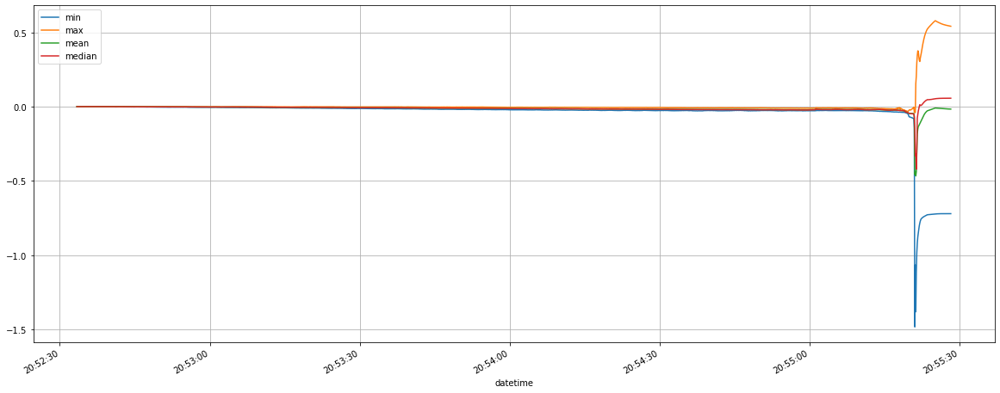

In [ ]:
df_dic.plot('datetime',['min', 'max', 'mean', 'median'],figsize=(20,8),grid=True)

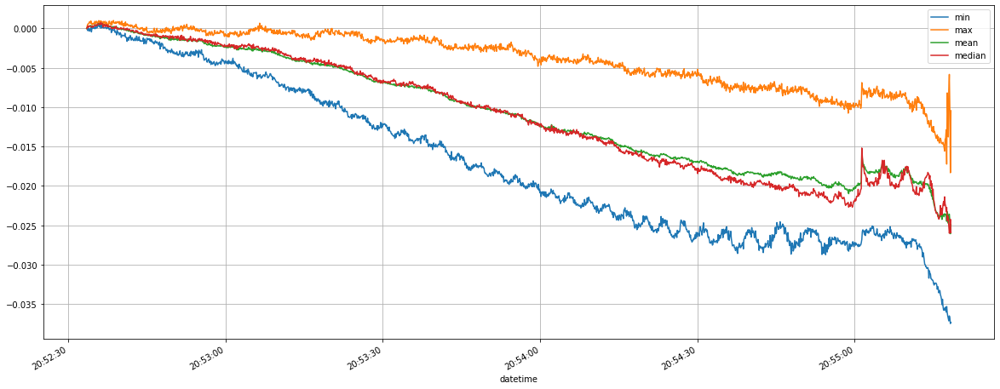

In [ ]:
df_dic[:-100].plot('datetime',['min', 'max', 'mean', 'median'],figsize=(20,8),grid=True)

In [ ]:
failure_time = pd.to_datetime('2022-12-19 20:55:04')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top',
                                   mode = 'markers'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
phy_top[270:300]

,t (s),Upright Tilt up/down (deg),Upright Tilt left/right (deg),Plane Inclination (deg),Side Tilt up/down (deg),Side Tilt left/right (deg),Flat Tilt up/down (deg),Flat Tilt left/right (deg),datetime
270,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
271,137.018229,-54.706816,4.935879,144.606371,85.064121,-86.501769,144.706817,176.501769,2022-12-19 20:51:04.916229000
272,137.794317,-139.391295,174.981933,130.500013,-84.981933,-84.152497,-130.608705,174.152497,2022-12-19 20:57:50.707316900
273,138.294317,-139.368457,175.008467,130.523986,-85.008467,-84.188018,-130.631543,174.188018,2022-12-19 20:57:51.207316900
274,139.294317,-139.104047,175.052010,130.790119,-85.052010,-84.291786,-130.895953,174.291786,2022-12-19 20:57:52.207316900
275,139.794317,-139.047994,175.153268,130.850434,-85.153268,-84.419386,-130.952006,174.419386,2022-12-19 20:57:52.707316900
276,140.294317,-138.663864,175.191656,131.235984,-85.191656,-84.537476,-131.336136,174.537476,2022-12-19 20:57:53.207316900
277,140.794317,-138.767250,175.426642,131.142199,-85.426642,-84.785253,-131.232750,174.785253,2022-12-19 20:57:53.707316900
278,141.294317,-138.483430,175.519635,131.429556,-85.519635,-84.941661,-131.516570,174.941661,2022-12-19 20:57:54.207316900
279,141.794317,-138.610722,175.452164,131.299671,-85.452164,-84.842656,-131.389278,174.842656,2022-12-19 20:57:54.707316900


In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)'], 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)'], 
                                   name = 'phy_top'))
fig.show()

In [ ]:
def failure_times(df_load, df_dic, phy_bot = None, phy_top = None, failure_time_aprox= None):
    """
    define the time where the sample reaches the max load
    :param df_load: dataframe with load cell info
    :param failure_time_aprox: if None, it will look at points before the 60% of max time
    :return: datetime when failure happened in the order: load, dic, phy_bot, phy_top
    """
    df_load = df_load.copy()
    df_load['MS_diff'] = df_load['MS-3k-S_Loadcell (Resampled)'].diff().abs()
    df_load['Air_diff'] = df_load['Airtech 3k ZLoad-CH2 (Resampled)'].diff().abs()
    failure_time_aprox = failure_time_aprox if failure_time_aprox else df_load.datetime[int(len(df_load) * .6)]
    max1 = df_load[df_load.datetime < failure_time_aprox]['MS_diff'].max()
    max2 = df_load[df_load.datetime < failure_time_aprox]['Air_diff'].max()
    failure1 = df_load[df_load['MS_diff'] == max1].datetime.values[0]
    failure2 = df_load[df_load['Air_diff'] == max2].datetime.values[0]

    time_failure_load = min(failure1, failure2)

    col = 'mean' if len(df_dic.columns) > 2 else df_dic.columns[1]
    df_tem = df_dic[(df_dic.datetime >= time_failure_load - pd.to_timedelta(10, 's')) & (
            df_dic.datetime <= time_failure_load + pd.to_timedelta(10, 's'))]
    diff = df_tem[col].diff().abs()
    diffname = diff.name + '_diff'
    diff.rename(diffname, inplace=True)
    df_tem = pd.concat([df_tem, diff], axis=1)

    time_failure_dic = df_tem[df_tem[diffname] == df_tem[diffname].max()].datetime.values[0]

    if phy_bot is not None:
        phy_bot_slice = phy_bot[(phy_bot.datetime >= time_failure_load - pd.to_timedelta(20, 's')) & (
                phy_bot.datetime <= time_failure_load + pd.to_timedelta(20, 's'))]
        time_failure_phy_bot = phy_bot.datetime[max_ortho_dist_index(phy_bot_slice)]
    else: 
        time_failure_phy_bot = None

    if phy_top is not None:
        phy_top_slice = phy_top[(phy_top.datetime >= time_failure_load - pd.to_timedelta(20, 's')) & (
                phy_top.datetime <= time_failure_load + pd.to_timedelta(20, 's'))]
        time_failure_phy_top = phy_top.datetime[max_ortho_dist_index(phy_top_slice)]
    else:
        time_failure_phy_top = None

    return time_failure_load, time_failure_dic, time_failure_phy_bot, time_failure_phy_top

In [ ]:
failure_time_aprox = pd.to_datetime('2022-12-19 20:55:00')
t_load, t_dic, t_bot, t_top = failure_times(df_load, df_dic, phy_bot, None, failure_time_aprox)
print('',t_load,'\n', t_dic,'\n', t_bot,'\n', t_top)

 2022-12-19T20:54:59.130236000 
 2022-12-19T20:55:01.350719000 
 2022-12-19 20:55:04.964682699 
 None


In [ ]:
failure_time_aprox

Timestamp('2022-12-19 20:55:00')

In [ ]:
t_l_dic = get_seconds(t_load,t_dic)
t_l_bot = get_seconds(t_load,t_bot)
# t_l_top = get_seconds(t_load,t_top)
print(t_l_dic,t_l_bot)#,t_l_top)

-2.220483 -5.834447


In [ ]:
# t_l_bot = t_l_bot + 1
t_l_top = t_l_bot + 4.5

In [ ]:
# df_dic.datetime = df_dic.datetime + pd.to_timedelta(t_l_dic,'s')
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(t_l_bot,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(t_l_top,'s')

In [ ]:
start_time = pd.to_datetime('2022-12-19 20:52:15')
end_time = pd.to_datetime('2022-12-19 20:55:05')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['datetime'],
                                   y = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['datetime'],
                                   y = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['rotation_deg']*100, 
                                   name = 'rotation'))
fig.show()

In [ ]:
start_time = pd.to_datetime('2022-12-19 20:52:15')
end_time = pd.to_datetime('2022-12-19 20:55:05')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['datetime'],
                                   y = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['datetime'],
                                   y = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['rotation_deg']*100, 
                                   name = 'rotation'))
fig.show()

In [ ]:
start_time = pd.to_datetime('2022-12-19 20:52:15')
end_time = pd.to_datetime('2022-12-19 20:55:05')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['datetime'],
                                   y = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['datetime'],
                                   y = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['rotation_deg']*100, 
                                   name = 'rotation'))
fig.show()

In [ ]:
start_time = pd.to_datetime('2022-12-19 20:52:15')
end_time = pd.to_datetime('2022-12-19 20:55:05')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['datetime'],
                                   y = df_load[(df_load.datetime>start_time)&(df_load.datetime<end_time)]['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['datetime'],
                                   y = df[~pd.isnull(df['rotation_deg'])&(df.datetime>start_time)&(df.datetime<end_time)]['rotation_deg']*100, 
                                   name = 'rotation'))
fig.show()

In [ ]:
delta = 58.8302 - 58.6302
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(delta,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(delta,'s')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
px.scatter(phy_top,'datetime','Plane Inclination (deg)')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig.show()

In [ ]:
# times on top phone
change = '1:15'
start_engin = '1:52'
begining = '2:19' # 1:04
failure = '5:02' # 2:43
falls = '6:27' # 1:25
# top
falls = '20:57:03'
failure = '20:55:38'
begining = '20:52:55'

begining = '20:53:20'
change = '20:52:16'

In [ ]:
df = mergeData(df_load, phy_bot, phy_top, df_dic)
df

,datetime,MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),Bottom Plane Inclination (deg),Top Plane Inclination (deg),min,max,mean,median
0,2022-12-19 20:48:45.630235708,NaN,NaN,84.499775,NaN,NaN,NaN,NaN,NaN
1,2022-12-19 20:48:46.130235708,NaN,NaN,84.590566,NaN,NaN,NaN,NaN,NaN
2,2022-12-19 20:48:46.630235708,NaN,NaN,84.137926,NaN,NaN,NaN,NaN,NaN
3,2022-12-19 20:48:47.081782010,NaN,NaN,84.357456,152.389964,NaN,NaN,NaN,NaN
4,2022-12-19 20:48:47.130235708,NaN,NaN,84.576986,152.252864,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
10464,2022-12-19 21:01:30.114666900,6.676657,546.063668,71.001484,86.981486,NaN,NaN,NaN,NaN
10465,2022-12-19 21:01:30.614666900,6.676657,546.063668,71.001484,62.001010,NaN,NaN,NaN,NaN
10466,2022-12-19 21:01:31.114666900,6.676657,546.063668,71.001484,72.837558,NaN,NaN,NaN,NaN
10467,2022-12-19 21:01:31.614666900,6.676657,546.063668,71.001484,73.320393,NaN,NaN,NaN,NaN


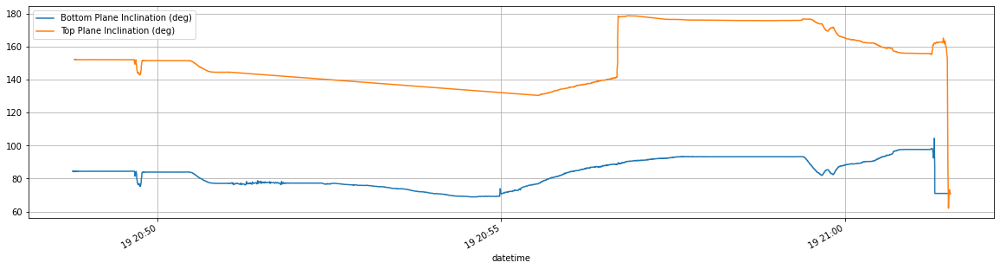

In [ ]:
df[~pd.isnull(df['Bottom Plane Inclination (deg)'])].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

<ipython-input-46-0db454fde95c>:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



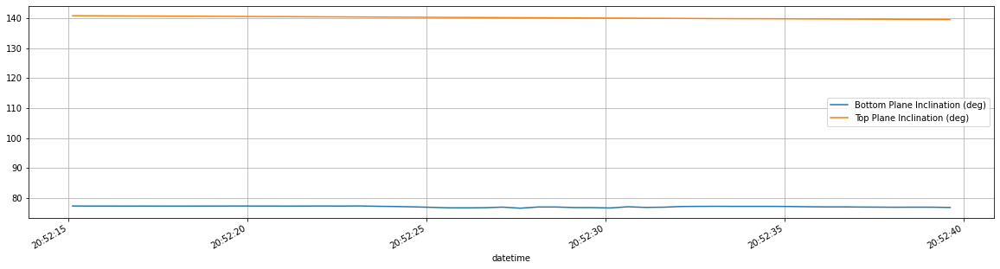

In [ ]:
ini = pd.to_datetime('2022-12-19 20:52:15')
fin = pd.to_datetime('2022-12-19 20:52:40')
df[~pd.isnull(df['Bottom Plane Inclination (deg)'])][(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

In [ ]:
bot_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Bottom Plane Inclination (deg)'].mean()
top_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Top Plane Inclination (deg)'].mean()
print(bot_ini,top_ini)

77.03527590979591 140.19813432499998


In [ ]:
df['rotation_deg'] = abs(df['Top Plane Inclination (deg)'] + (df['Bottom Plane Inclination (deg)'] - (top_ini+bot_ini)))

In [ ]:
start_time = '2022-12-19 20:52:50'
end_time = '2022-12-19 20:54:59'

In [ ]:
px.scatter(df[(df.datetime>start_time)&(df.datetime<end_time)],'rotation_deg','MS-3k-S_Loadcell (Resampled)')

In [ ]:
px.scatter(df[(df.datetime>start_time)&(df.datetime<end_time)],'rotation_deg','MS-3k-S_Loadcell (Resampled)')

In [ ]:
end_time

'2022-12-19 20:54:59'

<ipython-input-156-f66e8c1cdbfe>:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



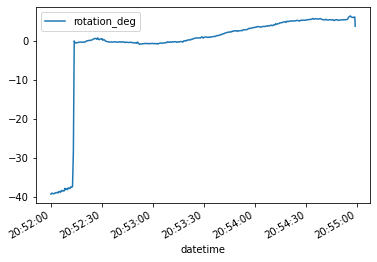

In [ ]:
ini = pd.to_datetime('2022-12-19 20:52:00')
fin = pd.to_datetime('2022-12-19 20:54:59')
df[(df.datetime>ini)&(df.datetime<fin)][~pd.isnull(df['rotation_deg'])].plot('datetime','rotation_deg')

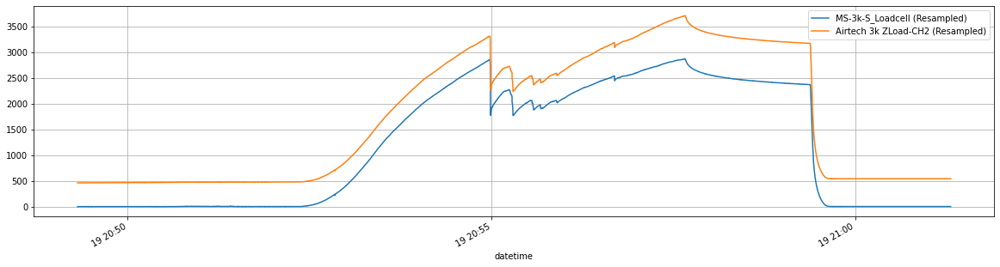

In [ ]:
df.plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

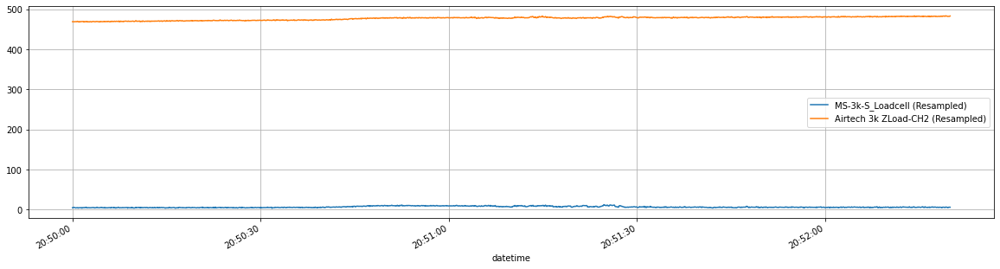

In [ ]:
ini = pd.to_datetime('2022-12-19 20:50:00')
fin = pd.to_datetime('2022-12-19 20:52:20')
df[(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

In [ ]:
air_ini_load = df.loc[df.datetime>=fin,'Airtech 3k ZLoad-CH2 (Resampled)'].values[0]
ms_ini_load = df.loc[(df.datetime>ini)&(df.datetime<fin),'MS-3k-S_Loadcell (Resampled)'].mean()
print(air_ini_load,ms_ini_load)

483.144737 6.913266415880066


In [ ]:
df_diameters[12:15]

,ID Culm,Internode,D1 (in) N-S,D1 (in) E-W,D2 (in) N-S,D2 (in) E-W,D3 (in) N-S,D3 (in) E-W,D (in) Avg.,Phy_bot,Phy_top,s (in),MC (%),Date,Observations
12,3,2,2.91,3.01,2.92,3.01,2.90,3.00,2.96,ok,ok,4.000,12.7,12/19/2022 20:43,backwards
13,3,4,2.97,3.06,2.96,3.05,2.93,3.06,3.01,ok,ok,7.625,11.6,12/20/2022 12:01,Split then a second split (2 failures)
14,3,6,2.97,3.11,2.96,3.09,2.93,3.12,3.03,ok,ok,10.625,11.3,12/20/2022 10:55,NaN


In [ ]:
OD_dict = df_diameters.T.to_dict()[12]
OD_dict

{'ID Culm': 3,
 'Internode': 2,
 'D1 (in) N-S': 2.91,
 'D1 (in) E-W': 3.01,
 'D2 (in) N-S': 2.92,
 'D2 (in) E-W': 3.01,
 'D3 (in) N-S': 2.9,
 'D3 (in) E-W': 3.0,
 'D (in) Avg.': 2.96,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 4.0,
 'MC (%)': 12.7,
 'Date': '12/19/2022 20:43',
 'Observations': 'backwards'}

In [ ]:
np.deg2rad(10)*2.96/2/4

0.06457718232379019

In [ ]:
df_ring_prop

,Unnamed: 0,outer_diameter_in,inner_diameter_in,bamboo_thickness_in,inner_diameter_min_in,inner_diameter_max_in,bamboo_thickness_min_in,bamboo_thickness_max_in,a1,a2,...,y_in,Ix_in4,Iy_in4,J_in4,Ac_in2,Pc_in,Jc_in4,Fiber Density,path,image_name
0,0,2.836204,2.260250,0.287977,2.231667,2.303333,0.276667,0.301667,[44.0],"[94.0, 100.0]",...,1.443004,1.893902,1.861866,3.755768,5.066406,8.423958,3.509953,0.422381,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_cropped2_cleaned.jpg
1,1,2.672407,1.528815,0.571796,1.472500,1.587500,0.538333,0.612500,[164.0],"[82.0, 88.0]",...,1.344267,2.234182,2.202727,4.436908,3.411049,6.939613,3.834794,0.425178,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_0_T_cropped2_cleaned.jpg
2,2,2.778870,1.768315,0.505278,1.726667,1.829167,0.472500,0.557500,[32.0],"[112.0, 114.0]",...,1.396439,2.439946,2.364838,4.804784,3.999264,7.493278,4.313983,0.409211,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_1_T_cropped2_cleaned.jpg
3,3,2.632269,2.107972,0.262148,2.068333,2.145000,0.237500,0.295000,[30.0],"[140.0, 142.0]",...,1.299785,1.373754,1.347543,2.721297,4.360488,7.820182,2.549529,0.393438,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_11_T_cropped2_cleaned.jpg
4,4,2.555954,2.077454,0.239250,2.057500,2.100833,0.218333,0.274167,[110.0],[32.0],...,1.281734,1.167872,1.154058,2.321931,4.166139,7.654870,2.169909,0.402110,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_12_4_T_cropped2_cleaned.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,159,2.873259,2.294954,0.289153,2.177500,2.381667,0.244167,0.318333,[174.0],"[94.0, 96.0]",...,1.462685,2.100084,1.863005,3.963089,5.187193,8.535110,3.646222,0.388638,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_9_1_T_cropped3_cleaned.jpg
160,160,2.624880,2.112778,0.256051,2.081667,2.150000,0.239167,0.275833,"[10.0, 12.0, 14.0]",[120.0],...,1.306997,1.354710,1.355202,2.709912,4.367757,7.853920,2.487808,0.398736,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_2_12_1_T_cropped6_cleaned.jpg
161,161,3.056037,2.304481,0.375778,2.275000,2.335833,0.349167,0.403333,[118.0],[20.0],...,1.508281,2.878856,2.874245,5.753101,5.581124,8.897812,5.262005,0.386125,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,Double-sided Scans_3_5_3_B_cropped6_cleaned.jpg
162,162,2.714981,2.164537,0.275222,2.128333,2.205000,0.255000,0.297500,"[66.0, 68.0]","[138.0, 140.0]",...,1.339552,1.559862,1.577974,3.137836,4.635900,8.082190,2.927403,0.413979,/content/drive/MyDrive/Daniel_Thesis/01_Data/0...,T scans_2_10_T_cropped6_cleaned.jpg


In [ ]:
printMatch(df_ring_prop.image_name,'_3_2_')

32 T scans_3_2_T_cropped2_cleaned.jpg
105 Double-sided Scans_3_3_2_T_cropped2_cleaned.jpg
112 Double-sided Scans_3_3_2_B_cropped2_cleaned.jpg
126 Double-sided Scans_2_3_2_B_cropped2_cleaned.jpg
136 Double-sided Scans_2_3_2_T_cropped2_cleaned.jpg
156 B scans_3_2_B_cropped6_cleaned.jpg


In [ ]:
df_ring_prop.loc[df_ring_prop.index.isin([32,156]),df_ring_prop.columns].T

,32,156
outer_diameter_in,3.003083,2.960759
inner_diameter_in,2.046843,1.919111
bamboo_thickness_in,0.47812,0.520824
inner_diameter_min_in,1.994167,1.823333
inner_diameter_max_in,2.100833,2.003333
bamboo_thickness_min_in,0.451667,0.4775
bamboo_thickness_max_in,0.504167,0.605
a1,[88.0],[68.0]
a2,"[174.0, 176.0]",[130.0]
a3,[252.0],"[352.0, 354.0]"


In [ ]:
J_in4 = df_ring_prop.loc[df_ring_prop.index.isin([32,156]),'J_in4'].mean()
J_in4

6.172716613865489

In [ ]:
ring_dict = df_ring_prop.T.to_dict()[32]
ring_dict

{'outer_diameter_in': 3.003083333333333,
 'inner_diameter_in': 2.0468425925925926,
 'bamboo_thickness_in': 0.4781203703703703,
 'inner_diameter_min_in': 1.9941666666666664,
 'inner_diameter_max_in': 2.1008333333333336,
 'bamboo_thickness_min_in': 0.4516666666666666,
 'bamboo_thickness_max_in': 0.5041666666666667,
 'a1': '[88.0]',
 'a2': '[174.0, 176.0]',
 'a3': '[252.0]',
 'a4': '[82.0, 88.0]',
 'area_in2': 3.79935625,
 'x_px': 1849.445716224221,
 'x_in': 1.5412047635201849,
 'y_px': 1756.8473816744906,
 'y_in': 1.464039484728742,
 'Ix_in4': 3.0303782167321747,
 'Iy_in4': 3.191249703332603,
 'J_in4': 6.221627920064778,
 'Ac_in2': 4.9548506944444455,
 'Pc_in': 8.35285718957583,
 'Jc_in4': 5.6211260865884745,
 'Fiber Density': 0.4159661185292172,
 'path': '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_3_2_T_cropped2_cleaned.jpg',
 'image_name': 'T scans_3_2_T_cropped2_cleaned.jpg'}

In [ ]:
OD_dict

{'ID Culm': 3,
 'Internode': 2,
 'D1 (in) N-S': 2.91,
 'D1 (in) E-W': 3.01,
 'D2 (in) N-S': 2.92,
 'D2 (in) E-W': 3.01,
 'D3 (in) N-S': 2.9,
 'D3 (in) E-W': 3.0,
 'D (in) Avg.': 2.96,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 4.0,
 'MC (%)': 12.7,
 'Date': '12/19/2022 20:43',
 'Observations': 'backwards'}

In [ ]:
OD = np.mean([ring_dict['outer_diameter_in'],OD_dict['D3 (in) N-S'],OD_dict['D3 (in) E-W']])
OD

2.967694444444444

In [ ]:
OD_mid = np.mean([OD_dict['D2 (in) N-S'],OD_dict['D2 (in) E-W']])
OD_mid

2.965

In [ ]:
df['T_ms (kip-in)'] = (df['MS-3k-S_Loadcell (Resampled)']-ms_ini_load)/1000 * (OD+wire_rope_D)
df['$\\tau (ksi)$'] = df['T_ms (kip-in)'] * OD/2 / J_in4
# df['$\gamma_{phones}$'] = np.deg2rad(df['rotation_deg']) *  OD_mid/2 / OD_dict['s (in)']
df['$\gamma_{DIC}$'] = df['mean'] if df['mean'].mean() > 0 else - df['mean']

In [ ]:
all_data_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/3_2_Merged_Data.csv'
df.to_csv(all_data_path,index=False)

In [ ]:
OD_dict['s (in)']

4.0

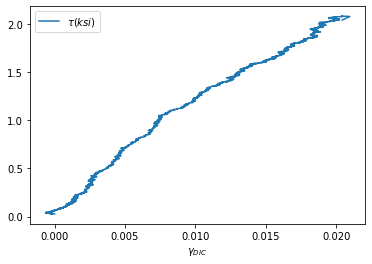

In [ ]:
df[~pd.isnull(df['mean'])&(df.datetime<end_time)].plot('$\gamma_{DIC}$','$\\tau (ksi)$')

In [ ]:
px.scatter(df[~pd.isnull(df['mean'])&(df.datetime<end_time)],'$\gamma_{DIC}$','$\\tau (ksi)$')

In [ ]:
fin

Timestamp('2022-12-19 20:52:20')

<ipython-input-86-bae8b946bce4>:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



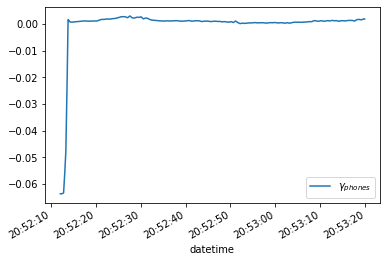

In [ ]:
df[~pd.isnull(df['$\gamma_{phones}$'])][(df.datetime>=pd.to_datetime('2022-12-19 20:52:12'))&(df.datetime<=pd.to_datetime('2022-12-19 20:53:20'))].plot('datetime','$\gamma_{phones}$')

In [ ]:
t_load

numpy.datetime64('2022-12-19T20:54:59.130236000')

In [ ]:
start_time = '2022-12-19 20:52:50'
end_time = '2022-12-19 20:54:59'
fig, G = ODR_results(df,start_time,end_time,min_max=(.10,.45))

In [ ]:
strain_stress = '/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/3_2_Strain_Stress.pdf'
fig.write_image(strain_stress, width=700, height=450, scale=3)

In [ ]:
G

[123.92927156973101]

In [ ]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(5,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(5,'s')),'$\\tau (ksi)$'].max()

2.141177060905769

In [ ]:
printMatch(ring_fib_paths,'_3_2_')

32 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/T scans_3_2_T_cropped2_cleaned_r10_w20_fiber_density.csv
105 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/Double-sided Scans_3_3_2_T_cropped2_cleaned_r10_w20_fiber_density.csv
112 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/Double-sided Scans_3_3_2_B_cropped2_cleaned_r10_w20_fiber_density.csv
126 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/Double-sided Scans_2_3_2_B_cropped2_cleaned_r10_w20_fiber_density.csv
136 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/Double-sided Scans_2_3_2_T_cropped2_cleaned_r10_w20_fiber_density.csv
156 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/B scans_3_2_B_cropped6_cleaned_r10_w20_fiber_density.csv


In [ ]:
printMatch(ring_img_paths,'_3_2_')

32 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_3_2_T_cropped2_cleaned.jpg
105 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_3_3_2_T_cropped2_cleaned.jpg
112 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_3_3_2_B_cropped2_cleaned.jpg
126 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_2_3_2_B_cropped2_cleaned.jpg
136 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_2_3_2_T_cropped2_cleaned.jpg
156 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_3_2_B_cropped6_cleaned.jpg


In [ ]:
df_fib = pd.read_csv(ring_fib_paths[32])


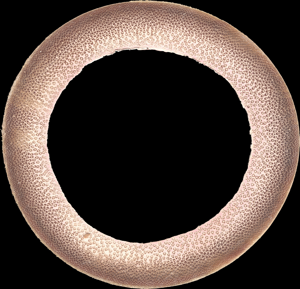

In [ ]:
fig = plotRing(df_fib,ring_img_paths[32],300,2)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/3_2_Fiber_density_Top_2.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

In [ ]:
printMatch(ring_img_paths,'_3_2_')

32 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_3_2_T_cropped2_cleaned.jpg
105 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_3_3_2_T_cropped2_cleaned.jpg
112 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_3_3_2_B_cropped2_cleaned.jpg
126 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_2_3_2_B_cropped2_cleaned.jpg
136 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/Double-sided Scans_2_3_2_T_cropped2_cleaned.jpg
156 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_3_2_B_cropped6_cleaned.jpg


In [ ]:
df_fib = pd.read_csv(ring_fib_paths[156])


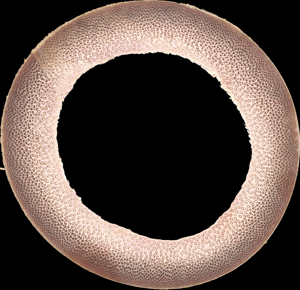

In [ ]:
fig = plotRing(df_fib,ring_img_paths[156],300,1)
fig.show()

In [ ]:
fd_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/3_2_Fiber_density_Bottom_1.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

## Sample 3.4

In [ ]:
printMatch(phy_folders,'3_4')

13 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_4


In [ ]:
folders = glob.glob(phy_folders[13]+'/*')
folders

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_4/Inclination 2022-12-20_3.4_top',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_4/Inclination 2022-12-20_3.4_bottom']

In [ ]:
phy_bot, phy_top = phy_bot_top(folders)

In [ ]:
printMatch(load_cell_paths,'3_4')

13 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/3_4.lvm


In [ ]:
df_load = read_lvm(load_cell_paths[13])

In [ ]:
df_DIC_info[df_DIC_info.sampleID == '3_4']

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
26,3_4,left_top,2022-12-20 16:32:10+00:00,202891040.0,202991040.0,NaN,2031.0,-1.310459,705.0,388.0,912.0,579.0,to explore
27,3_4,rigth_top,2022-12-20 16:32:10+00:00,202891041.0,202991041.0,NaN,2031.0,-1.668337,582.0,366.0,804.0,564.0,to explore


In [ ]:
df_DIC_info[df_DIC_info.sampleID == '3_4'].comment.values

array(['to explore', 'to explore'], dtype=object)

In [ ]:
printMatch(DIC_paths,'3_4')

19 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_4_DIC_left.csv
20 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_4_DIC_right.csv


In [ ]:
df_dic = loadDIC(DIC_paths[20],df_DIC_info,'3_4','r','lastFrame')
df_dic

,microSeconds,min,max,mean,median,datetime
0,24087064.0,0.000000,0.000000,0.000000,0.000000,2022-12-20 12:29:11.196023
1,24187011.0,-0.000334,0.000573,0.000067,0.000015,2022-12-20 12:29:11.295970
2,24286957.0,-0.000710,0.000134,-0.000220,-0.000152,2022-12-20 12:29:11.395916
3,24386904.0,-0.000573,0.000416,-0.000102,-0.000126,2022-12-20 12:29:11.495863
4,24486850.0,-0.000647,0.000550,-0.000030,-0.000011,2022-12-20 12:29:11.595809
...,...,...,...,...,...,...
872,111240260.0,-0.144969,0.000043,-0.066914,-0.061366,2022-12-20 12:30:38.349219
873,111340207.0,-0.148354,0.000096,-0.067323,-0.060516,2022-12-20 12:30:38.449166
874,111440153.0,-0.151273,-0.000012,-0.068204,-0.060766,2022-12-20 12:30:38.549112
875,111540099.0,-0.149703,0.000004,-0.067638,-0.060426,2022-12-20 12:30:38.649058


In [ ]:
px.line(df_dic[:846],'datetime',df_dic.columns[1:])

In [ ]:
failure_time = pd.to_datetime('2022-12-20 12:30:38')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)'], 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)'], 
                                   name = 'phy_top'))
fig.show()

In [ ]:
failure_time_aprox = pd.to_datetime('2022-12-20 12:30:40')
t_load, t_dic, t_bot, t_top = failure_times(df_load, df_dic, phy_bot, phy_top, failure_time_aprox)
print('',t_load,'\n', t_dic,'\n', t_bot,'\n', t_top)

 2022-12-20T12:30:33.497231999 
 2022-12-20T12:30:35.750615000 
 2022-12-20 12:30:38.900176800 
 2022-12-20 12:30:34.716554800


In [ ]:
t_l_dic = get_seconds(t_load,t_dic)
t_l_bot = get_seconds(t_load,t_bot)
t_l_top = get_seconds(t_load,t_top)
print(t_l_dic,t_l_bot,t_l_top)

-2.253383001 -5.402945 -1.219323


In [ ]:
df_dic.datetime = df_dic.datetime + pd.to_timedelta(t_l_dic,'s')
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(t_l_bot,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(t_l_top,'s')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*-100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig.show()

In [ ]:
df = mergeData(df_load, phy_bot, phy_top, df_dic)
df

,datetime,MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),Bottom Plane Inclination (deg),Top Plane Inclination (deg),min,max,mean,median
0,2022-12-20 12:28:00.797231999,20.467356,492.651437,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-12-20 12:28:00.897231999,19.926181,491.914778,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-12-20 12:28:00.997231999,20.522041,492.123042,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-12-20 12:28:01.097231999,20.458322,492.592427,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-12-20 12:28:01.797231999,19.838532,492.162830,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
4101,2022-12-20 12:32:21.397231999,1359.381499,1820.595736,NaN,NaN,NaN,NaN,NaN,NaN
4102,2022-12-20 12:32:21.497231999,1359.443295,1820.789776,NaN,NaN,NaN,NaN,NaN,NaN
4103,2022-12-20 12:32:21.597231999,1359.658189,1820.525194,NaN,NaN,NaN,NaN,NaN,NaN
4104,2022-12-20 12:32:21.697231999,1359.256080,1820.801309,NaN,NaN,NaN,NaN,NaN,NaN


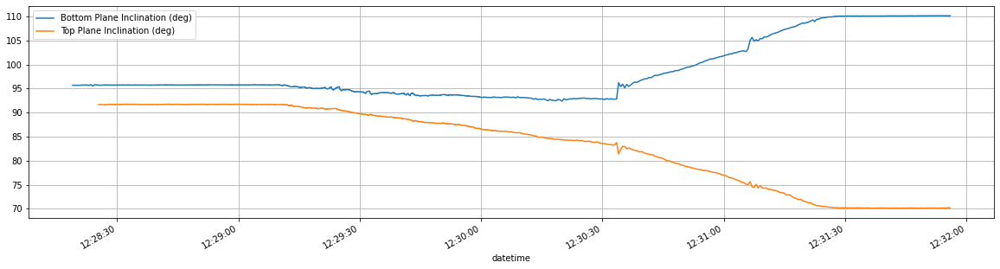

In [ ]:
df[~pd.isnull(df['Bottom Plane Inclination (deg)'])].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

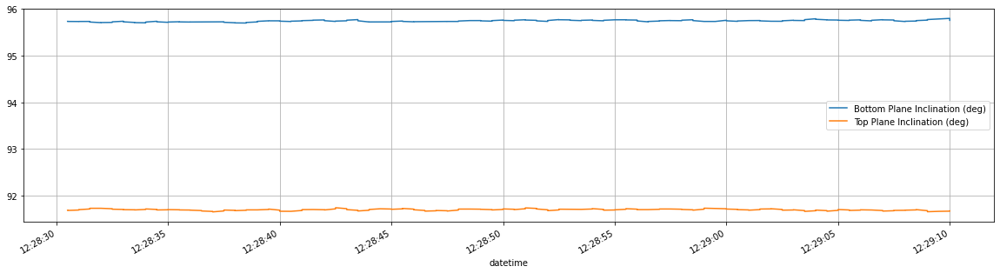

In [ ]:
ini = pd.to_datetime('2022-12-20 12:28:30')
fin = pd.to_datetime('2022-12-20 12:29:10')
df[~pd.isnull(df['Bottom Plane Inclination (deg)'])&(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'],figsize=(20,5),grid=True)

In [ ]:
bot_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Bottom Plane Inclination (deg)'].mean()
top_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Top Plane Inclination (deg)'].mean()
df['rotation_deg'] = df['Top Plane Inclination (deg)'] - (df['Bottom Plane Inclination (deg)'] + (top_ini-bot_ini))

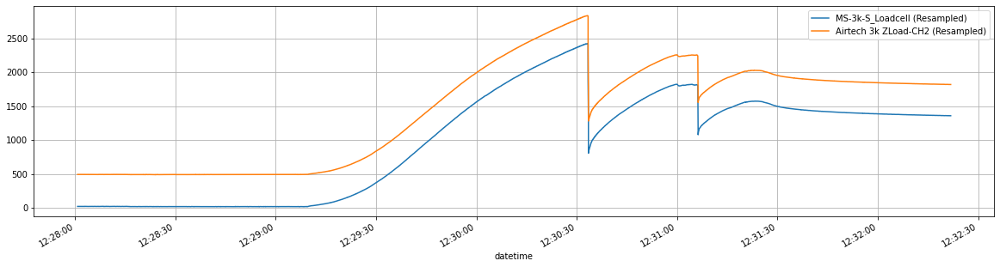

In [ ]:
df.plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

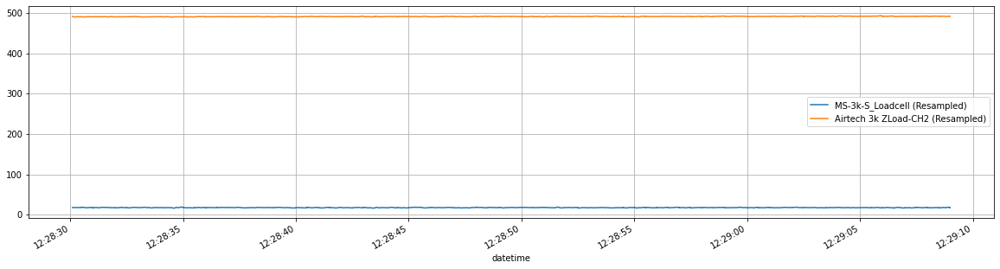

In [ ]:
ini = pd.to_datetime('2022-12-20 12:28:30')
fin = pd.to_datetime('2022-12-20 12:29:09')
df[(df.datetime>ini)&(df.datetime<fin)].plot('datetime',['MS-3k-S_Loadcell (Resampled)',
       'Airtech 3k ZLoad-CH2 (Resampled)'],figsize=(20,5),grid=True)

In [ ]:
air_ini_load = df.loc[df.datetime>=fin,'Airtech 3k ZLoad-CH2 (Resampled)'].values[0]
ms_ini_load = df.loc[(df.datetime>ini)&(df.datetime<fin),'MS-3k-S_Loadcell (Resampled)'].mean()
print(air_ini_load,ms_ini_load)

491.6986335 17.7272752


In [ ]:
df_diameters[13:15]

,ID Culm,Internode,D1 (in) N-S,D1 (in) E-W,D2 (in) N-S,D2 (in) E-W,D3 (in) N-S,D3 (in) E-W,D (in) Avg.,Phy_bot,Phy_top,s (in),MC (%),Date,Observations
13,3,4,2.97,3.06,2.96,3.05,2.93,3.06,3.01,ok,ok,7.625,11.6,12/20/2022 12:01,Split then a second split (2 failures)
14,3,6,2.97,3.11,2.96,3.09,2.93,3.12,3.03,ok,ok,10.625,11.3,12/20/2022 10:55,NaN


In [ ]:
OD_dict = df_diameters.T.to_dict()[13]
OD_dict

{'ID Culm': 3,
 'Internode': 4,
 'D1 (in) N-S': 2.97,
 'D1 (in) E-W': 3.06,
 'D2 (in) N-S': 2.96,
 'D2 (in) E-W': 3.05,
 'D3 (in) N-S': 2.93,
 'D3 (in) E-W': 3.06,
 'D (in) Avg.': 3.01,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 7.625,
 'MC (%)': 11.6,
 'Date': '12/20/2022 12:01',
 'Observations': 'Split then a second split (2 failures)'}

In [ ]:
printMatch(df_ring_prop.image_name,'_3_4_')

13 T scans_2_3_4_T_cropped2_cleaned.jpg
34 T scans_3_3_4_T_cropped2_cleaned.jpg
35 T scans_3_4_T_cropped2_cleaned.jpg
74 B scans_3_4_B_cropped2_cleaned.jpg
86 Double-sided Scans_3_3_4_B_cropped2_cleaned.jpg
131 Double-sided Scans_2_3_4_B_cropped2_cleaned.jpg


In [ ]:
df_ring_prop.loc[df_ring_prop.index.isin([35,74]),df_ring_prop.columns].T

,35,74
outer_diameter_in,3.026574,2.958556
inner_diameter_in,2.224648,2.075593
bamboo_thickness_in,0.400963,0.441481
inner_diameter_min_in,2.168333,1.989167
inner_diameter_max_in,2.295,2.183333
bamboo_thickness_min_in,0.3725,0.411667
bamboo_thickness_max_in,0.426667,0.471667
a1,[134.0],"[60.0, 68.0]"
a2,[20.0],[162.0]
a3,[204.0],[344.0]


In [ ]:
J_in4 = df_ring_prop.loc[df_ring_prop.index.isin([35,74]),'J_in4'].mean()
J_in4

4.890359374271105

In [ ]:
ring_dict = df_ring_prop.T.to_dict()[74]
ring_dict

{'outer_diameter_in': 2.9585555555555554,
 'inner_diameter_in': 2.0755925925925927,
 'bamboo_thickness_in': 0.4414814814814815,
 'inner_diameter_min_in': 1.9891666666666667,
 'inner_diameter_max_in': 2.183333333333333,
 'bamboo_thickness_min_in': 0.4116666666666667,
 'bamboo_thickness_max_in': 0.4716666666666667,
 'a1': '[60.0, 68.0]',
 'a2': '[162.0]',
 'a3': '[344.0]',
 'a4': '[176.0]',
 'area_in2': 3.5149541666666666,
 'x_px': 1823.1830415443224,
 'x_in': 1.5193192012869352,
 'y_px': 1699.6702132199448,
 'y_in': 1.416391844349954,
 'Ix_in4': 2.6963144765576788,
 'Iy_in4': 2.96443494745868,
 'J_in4': 5.660749424016359,
 'Ac_in2': 4.898344097222223,
 'Pc_in': 8.333010332783063,
 'Jc_in4': 5.084744582740997,
 'Fiber Density': 0.4353840159919898,
 'path': '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_3_4_B_cropped2_cleaned.jpg',
 'image_name': 'B scans_3_4_B_cropped2_cleaned.jpg'}

In [ ]:
OD = np.mean([ring_dict['outer_diameter_in'],OD_dict['D1 (in) N-S'],OD_dict['D1 (in) E-W']])
OD

2.996185185185185

In [ ]:
OD_mid = np.mean([OD_dict['D2 (in) N-S'],OD_dict['D2 (in) E-W']])
OD_mid

3.005

In [ ]:
df['T_ms (kip-in)'] = (df['MS-3k-S_Loadcell (Resampled)']-ms_ini_load)/1000 * (OD+wire_rope_D)
df['$\\tau (ksi)$'] = df['T_ms (kip-in)'] * OD/2 / J_in4
df['$\gamma_{phones}$'] = np.deg2rad(df['rotation_deg']) *  OD_mid/2 / OD_dict['s (in)']
df['$\gamma_{phones}$'] = df['$\gamma_{phones}$'] if df['$\gamma_{phones}$'].mean() > 0 else - df['$\gamma_{phones}$']
df['$\gamma_{DIC}$'] = df['mean'] if df['mean'].mean() > 0 else - df['mean']

In [ ]:
all_data_path = '/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/3_4_Merged_Data.csv'
df.to_csv(all_data_path,index=False)

In [ ]:
fin

Timestamp('2022-12-20 12:29:09')

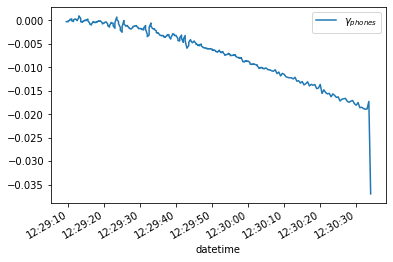

In [ ]:
df[~pd.isnull(df['$\gamma_{phones}$'])&(df.datetime>=pd.to_datetime('2022-12-20 12:29:09'))&(df.datetime<=pd.to_datetime('2022-12-20 12:30:34'))].plot('datetime','$\gamma_{phones}$')

In [ ]:
t_load

numpy.datetime64('2022-12-20T12:30:33.497231999')

In [ ]:
start_time = '2022-12-20 12:29:09'
end_time = '2022-12-20 12:30:33.4'
fig, G = ODR_results(df,start_time,end_time,min_max=(.1,.55))

In [ ]:
strain_stress = '/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/3_4_Strain_Stress.pdf'
fig.write_image(strain_stress, width=700, height=450, scale=3)

In [ ]:
G

[139.24223788298806, 331.7731074677271]

In [ ]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(5,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(5,'s')),'$\\tau (ksi)$'].max()

1.845605267386821

## Merging data

In [ ]:
id = '3_20'
culm,internode = id.split('_')
df_diameters[(df_diameters['ID Culm']==int(culm))&(df_diameters['Internode']==int(internode))].T.to_dict()

{22: {'ID Culm': 3,
  'Internode': 20,
  'D1 (in) N-S': 2.19,
  'D1 (in) E-W': 2.15,
  'D2 (in) N-S': 2.17,
  'D2 (in) E-W': 2.1,
  'D3 (in) N-S': 2.13,
  'D3 (in) E-W': 2.06,
  'D (in) Avg.': 2.13,
  'Phy_bot': 'ok',
  'Phy_top': 'ok',
  's (in)': 11.0625,
  'MC (%)': 11.2,
  'Date': '10/12/2022 0:44',
  'Observations': 'changes at edges. load backwards'}}

### Load phyphox

In [ ]:
folders = glob.glob(phy_folders[22]+'/*')
folders

['/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_20/Inclination 2022-10-12_3.20_bottom',
 '/content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/phyphox/3_20/Inclination 2022-10-12_3.20_top']

In [ ]:
phy_bot, phy_top = phy_bot_top(folders)

### Load load-cell

In [ ]:
printMatch(load_cell_paths,id)

34 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/LabView - Load Cells Data/3_20.lvm


In [ ]:
df_load = read_lvm(load_cell_paths[34])

### Load DIC

In [ ]:
df_DIC_info[df_DIC_info.sampleID == id]

,sampleID,camera,datetime,lastFrame,duration,diff,frames,angle_deg,x_start,y_start,x_end,y_end,comment
52,3_20,left_bot,2022-10-12 05:03:53.497581+00:00,NaN,188802823.0,NaN,5402.0,NaN,NaN,NaN,NaN,NaN,low resolution
53,3_20,rigth_bot,2022-10-12 05:03:53.667657+00:00,NaN,188802823.0,NaN,5402.0,NaN,NaN,NaN,NaN,NaN,low resolution
54,3_20,left_top,2022-10-12 05:03:53.031803+00:00,NaN,188636065.0,NaN,4304.0,NaN,NaN,NaN,NaN,NaN,low resolution
55,3_20,rigth_top,2022-10-12 05:03:53.130669+00:00,NaN,188636065.0,NaN,4304.0,NaN,NaN,NaN,NaN,NaN,low resolution
64,3_20,col_bot,2022-10-12 05:03:53.308279+00:00,188769492.0,188802825.0,33333.0,5402.0,2.542351,791.0,487.0,1170.0,743.0,bad DIC. To explore cause spikel pattern was g...
65,3_20,col_top,2022-10-12 05:03:52.813560+00:00,188602758.0,188636091.0,33333.0,4304.0,-9.139615,885.0,510.0,1318.0,756.0,seems pretty good. To explore better


In [ ]:
df_DIC_info[df_DIC_info.sampleID == id].comment.values

array(['low resolution', 'low resolution', 'low resolution',
       'low resolution',
       'bad DIC. To explore cause spikel pattern was good as well as mesh',
       'seems pretty good. To explore better'], dtype=object)

In [ ]:
printMatch(DIC_paths,id)

36 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_20_DIC_color_bot.csv
37 /content/drive/MyDrive/Daniel_Thesis/01_Data/01_WireRopeTests/muDIC_Results/3_20_DIC_color_top.csv


In [ ]:
df_dic = loadDIC(DIC_paths[37],df_DIC_info,id,'col_top','duration') # col_top

In [ ]:
px.line(df_dic[:int(len(df_dic)*.90)],'datetime',df_dic.columns[1:]) # to choose the better between left and right

### Adjust datetime

In [ ]:
failure_time = pd.to_datetime('2022-10-12 01:03:16')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
t_cut = pd.to_datetime('2022-10-17 21:15:42')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot[phy_bot.datetime<t_cut]['datetime'],
                                   y = phy_bot[phy_bot.datetime<t_cut]['Plane Inclination (deg)'], 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top[phy_top.datetime<t_cut]['datetime'],
                                   y = phy_top[phy_top.datetime<t_cut]['Plane Inclination (deg)'], 
                                   name = 'phy_top'))
fig.show()

In [ ]:
t_load, t_dic, t_bot, t_top = failure_times(df_load, df_dic=df_dic, phy_bot=phy_bot, phy_top=phy_top, failure_time_aprox=failure_time)
print('',t_load,'\n', t_dic,'\n', t_bot,'\n', t_top)

 2022-10-12T01:03:11.127552000 
 2022-10-12T01:03:16.226980000 
 2022-10-12 01:03:12.205843100 
 2022-10-12 01:03:14.007794400


In [ ]:
# t_load = pd.to_datetime('2022-10-12T04:25:52.0328')
t_dic = pd.to_datetime('2022-10-12 01:03:15.6934')
t_bot = pd.to_datetime('2022-10-12 01:03:11.7058')
# t_top = pd.to_datetime('2022-10-12 03:31:10.3168')

In [ ]:
t_l_dic = get_seconds(t_load,t_dic)
t_l_bot = get_seconds(t_load,t_bot)
t_l_top = get_seconds(t_load,t_top)
print(t_l_dic,t_l_bot,t_l_top)#(t_l_dic,

-4.565848 -0.578248 -2.880243


In [ ]:
t_l_dic

0.329791

In [ ]:
t_l_dic

1.1292

In [ ]:
t_l_bot = t_l_top + .2996

In [ ]:
df_dic.datetime = df_dic.datetime + pd.to_timedelta(t_l_dic,'s')
phy_bot.datetime = phy_bot.datetime + pd.to_timedelta(t_l_bot,'s')
phy_top.datetime = phy_top.datetime + pd.to_timedelta(t_l_top,'s')

In [ ]:
df_dic.datetime = df_dic.datetime - pd.to_timedelta(-4.892000000000003,'s')

In [ ]:
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = df_load['datetime'],
                                   y = df_load['MS-3k-S_Loadcell (Resampled)'], 
                                   name = 'Load'))
fig = fig.add_trace(go.Scatter(x = phy_bot['datetime'],
                                   y = phy_bot['Plane Inclination (deg)']*10, 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top['datetime'],
                                   y = phy_top['Plane Inclination (deg)']*10, 
                                   name = 'phy_top'))
fig = fig.add_trace(go.Scatter(x = df_dic[df_dic['datetime']<failure_time]['datetime'],
                                   y = df_dic[df_dic['datetime']<failure_time]['mean']*100000, 
                                   name = 'DIC'))
fig.show()

In [ ]:
t_cut = pd.to_datetime('2022-12-20 17:46:44')
fig = go.Figure()

fig = fig.add_trace(go.Scatter(x = phy_bot[phy_bot.datetime<t_cut]['datetime'],
                                   y = phy_bot[phy_bot.datetime<t_cut]['Plane Inclination (deg)'], 
                                   name = 'phy_bottom'))
fig = fig.add_trace(go.Scatter(x = phy_top[phy_top.datetime<t_cut]['datetime'],
                                   y = phy_top[phy_top.datetime<t_cut]['Plane Inclination (deg)'], 
                                   name = 'phy_top'))
fig.show()

### Merge

In [ ]:
df = mergeData(df_load, df_dic=df_dic, phy_bot=phy_bot, phy_top=phy_top)
df

,datetime,MS-3k-S_Loadcell (Resampled),Airtech 3k ZLoad-CH2 (Resampled),min,max,mean,median,Bottom Plane Inclination (deg),Top Plane Inclination (deg)
0,2022-10-12 00:56:44.327552000,2.284107,7.369959,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-10-12 00:56:44.527552000,2.885637,7.920267,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-10-12 01:00:53.127595125,2.991223,8.031474,NaN,NaN,NaN,NaN,141.560025,NaN
3,2022-10-12 01:00:53.627595125,3.096809,8.142682,NaN,NaN,NaN,NaN,142.108168,NaN
4,2022-10-12 01:00:54.127595125,3.202394,8.253889,NaN,NaN,NaN,NaN,141.987712,NaN
...,...,...,...,...,...,...,...,...,...
4217,2022-10-12 01:04:03.327552000,366.515161,350.415407,NaN,NaN,NaN,NaN,NaN,NaN
4218,2022-10-12 01:04:03.527552000,366.494498,349.718537,NaN,NaN,NaN,NaN,NaN,NaN
4219,2022-10-12 01:04:03.727552000,366.930341,349.258185,NaN,NaN,NaN,NaN,NaN,NaN
4220,2022-10-12 01:04:03.927552000,366.461053,349.465199,NaN,NaN,NaN,NaN,NaN,NaN


### Initial displacements and loads

In [ ]:
ini = pd.to_datetime('2022-10-12 01:01:02')
fin = pd.to_datetime('2022-10-12 01:01:16')
df_slide = df[~pd.isnull(df['Bottom Plane Inclination (deg)'])&(df.datetime>ini)&(df.datetime<fin)]
px.line(df_slide,'datetime',['Bottom Plane Inclination (deg)','Top Plane Inclination (deg)'])

In [ ]:
bot_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Bottom Plane Inclination (deg)'].mean()
top_ini = df[(df.datetime>ini)&(df.datetime<fin)]['Top Plane Inclination (deg)'].mean()
df['rotation_deg'] = df['Top Plane Inclination (deg)'] - (df['Bottom Plane Inclination (deg)'] + (top_ini-bot_ini))

In [ ]:
ini = pd.to_datetime('2022-10-17 16:58:52')
fin = pd.to_datetime('2022-10-17 17:59:53')
px.line(df[(df.datetime>ini)&(df.datetime<fin)&~pd.isnull(df['rotation_deg'])],'datetime','rotation_deg')

In [ ]:
px.line(df,'datetime',['MS-3k-S_Loadcell (Resampled)','Airtech 3k ZLoad-CH2 (Resampled)'])

In [ ]:
df.datetime[0]

Timestamp('2022-10-17 22:16:17.383914')

In [ ]:
ini = pd.to_datetime('2022-10-12 01:01:00')
fin = pd.to_datetime('2022-10-12 01:01:02')
df_slide = df[(df.datetime>ini)&(df.datetime<fin)]
px.line(df_slide,'datetime',['MS-3k-S_Loadcell (Resampled)','Airtech 3k ZLoad-CH2 (Resampled)'])

In [ ]:
air_ini_load = df.loc[df.datetime>=fin,'Airtech 3k ZLoad-CH2 (Resampled)'].values[0]
ms_ini_load = df.loc[(df.datetime>ini)&(df.datetime<fin),'MS-3k-S_Loadcell (Resampled)'].mean()
print(air_ini_load,ms_ini_load)

10.255623493150685 4.680595157534247


In [ ]:
ini = pd.to_datetime('2022-10-17 21:13:05')
fin = pd.to_datetime('2022-10-17 21:13:18')
# ini = pd.to_datetime('2022-10-17 21:12:05')
# fin = pd.to_datetime('2022-10-17 21:14:16')
df_slide = df[(df.datetime>ini)&(df.datetime<fin)]
px.line(df_slide[~pd.isnull(df_slide['mean'])],'datetime',['mean'])

In [ ]:
df_slide['mean'].min()

-0.0046489720132288

In [ ]:
df['mean'] = df['mean'] - df_slide['mean'].min()

### Properties
Look at the video and/or comments to see if bamboo was oriented with bottom at with the MS-3k_S_Loadcell

In [ ]:
df_diameters[20:25]

,ID Culm,Internode,D1 (in) N-S,D1 (in) E-W,D2 (in) N-S,D2 (in) E-W,D3 (in) N-S,D3 (in) E-W,D (in) Avg.,Phy_bot,Phy_top,s (in),MC (%),Date,Observations
20,3,16,2.44,2.54,2.47,2.47,2.45,2.41,2.46,ok,ok,8.8750,12.3,10/12/2022 3:16,backwards. Got crushed a bit at bot edge
21,3,18,2.36,2.35,2.34,2.33,2.26,2.27,2.32,ok,ok,12.0000,11.9,10/12/2022 2:08,NaN
22,3,20,2.19,2.15,2.17,2.10,2.13,2.06,2.13,ok,ok,11.0625,11.2,10/12/2022 0:44,changes at edges. load backwards


In [ ]:
OD_dict = df_diameters.T.to_dict()[22]
OD_dict

{'ID Culm': 3,
 'Internode': 20,
 'D1 (in) N-S': 2.19,
 'D1 (in) E-W': 2.15,
 'D2 (in) N-S': 2.17,
 'D2 (in) E-W': 2.1,
 'D3 (in) N-S': 2.13,
 'D3 (in) E-W': 2.06,
 'D (in) Avg.': 2.13,
 'Phy_bot': 'ok',
 'Phy_top': 'ok',
 's (in)': 11.0625,
 'MC (%)': 11.2,
 'Date': '10/12/2022 0:44',
 'Observations': 'changes at edges. load backwards'}

In [ ]:
printMatch(df_ring_prop.image_name,f'_{id}_')

33 T scans_3_20_T_cropped2_cleaned.jpg
72 B scans_3_20_B_cropped2_cleaned.jpg


In [ ]:
df_ring_prop.loc[df_ring_prop.index.isin([33,72]),df_ring_prop.columns].T

In [ ]:
J_in4 = df_ring_prop.loc[df_ring_prop.index.isin([33,72]),'J_in4'].mean()
J_in4

1.1633035149696243

In [ ]:
ring_dict = df_ring_prop.T.to_dict()[33]
ring_dict

{'outer_diameter_in': 2.042222222222222,
 'inner_diameter_in': 1.605972222222222,
 'bamboo_thickness_in': 0.218125,
 'inner_diameter_min_in': 1.5733333333333333,
 'inner_diameter_max_in': 1.6333333333333333,
 'bamboo_thickness_min_in': 0.2016666666666666,
 'bamboo_thickness_max_in': 0.2391666666666666,
 'a1': '[0.0]',
 'a2': '[88.0]',
 'a3': '[212.0, 214.0]',
 'a4': '[144.0]',
 'area_in2': 1.2536104166666666,
 'x_px': 1233.4512405557505,
 'x_in': 1.0278760337964588,
 'y_px': 1228.6824826514971,
 'y_in': 1.0239020688762477,
 'Ix_in4': 0.5277860130269924,
 'Iy_in4': 0.5181944655371911,
 'J_in4': 1.0459804785641835,
 'Ac_in2': 2.585296180555556,
 'Pc_in': 6.0331673942009605,
 'Jc_in4': 0.9665863760548128,
 'Fiber Density': 0.4081212099053899,
 'path': '/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_3_20_T_cropped2_cleaned.jpg',
 'image_name': 'T scans_3_20_T_cropped2_cleaned.jpg'}

In [ ]:
OD = np.mean([ring_dict['outer_diameter_in'],OD_dict['D3 (in) N-S'],OD_dict['D3 (in) E-W']])
OD

2.077407407407408

In [ ]:
OD = OD + 0.164

In [ ]:
OD_mid = np.mean([OD_dict['D2 (in) N-S'],OD_dict['D2 (in) E-W']])
OD_mid

2.135

### $G_{23}$ and $\tau$

In [ ]:
df['T_ms (kip-in)'] = (df['MS-3k-S_Loadcell (Resampled)']-ms_ini_load)/1000 * (OD+wire_rope_D)
df['$\\tau (ksi)$'] = df['T_ms (kip-in)'] * OD/2 / J_in4
df['$\gamma_{phones}$'] = np.deg2rad(df['rotation_deg']) *  OD_mid/2 / OD_dict['s (in)']
df['$\gamma_{phones}$'] = df['$\gamma_{phones}$'] if df[int(len(df)*.2):int(len(df)*.5)]['$\gamma_{phones}$'].mean() > 0 else - df['$\gamma_{phones}$']
df['$\gamma_{DIC}$'] = df['mean'] if df[int(len(df)*.2):int(len(df)*.5)]['mean'].mean() > 0 else - df['mean']

In [ ]:
all_data_path = f'/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/{id}_Merged_Data.csv'
df.to_csv(all_data_path,index=False)

In [ ]:
fin

Timestamp('2022-10-12 01:01:02')

In [ ]:
ini = pd.to_datetime('2022-10-12 01:01:02')
fin = pd.to_datetime('2022-10-12 01:03:12')
df_slide = df[~pd.isnull(df['$\gamma_{phones}$'])&(df.datetime>=ini)&(df.datetime<=fin)]
px.line(df_slide,'datetime','$\gamma_{phones}$')

In [ ]:
t_load

numpy.datetime64('2022-10-12T01:03:11.127552000')

In [ ]:
start_time = '2022-10-12 01:01:18'
end_time = '2022-10-12 01:03:11.12'
fig, G = ODR_results(df,start_time,end_time,min_max=(.0,.60))

In [ ]:
strain_stress = f'/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/{id}_Strain_Stress.pdf'
fig.write_image(strain_stress, width=700, height=450, scale=3)

In [ ]:
G

[172.26071924311347, 181.62625801370027]

In [ ]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(10,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(10,'s')),'$\\tau (ksi)$'].max()

2.242316060641322

## Fiber Density

In [ ]:
printMatch(ring_img_paths,'_2_1_')

2 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/T scans_2_1_T_cropped2_cleaned.jpg
42 /content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/Cleaned/B scans_2_1_B_cropped2_cleaned.jpg


In [ ]:
fpaths = []
for i in df_diameters.index:
    id = df_diameters['ID Culm'][i]
    node = df_diameters['Internode'][i]
    top = f'scans_{id}_{node}_T'
    bot = f'scans_{id}_{node}_B'
    for path in ring_img_paths:
        if top in path or bot in path:
            fpaths.append(path)

In [ ]:
caso = 1
for p in tqdm(fpaths):
    k = p.split('scans_')[-1].split('_cropped')[0]
    bname = os.path.basename(p).split('.jpg')[0]
    ring_fib_path = f'/content/drive/MyDrive/Daniel_Thesis/01_Data/03_Scans/Scans_jpg/06_Fiber_Density2_r10_w20/{bname}_r10_w20_fiber_density.csv'
    df_fib = pd.read_csv(ring_fib_path)
    df_fib.loc[(df_fib.area<100)|(df_fib.density>1)] = np.nan
    
    fig = plotRing(df_fib,p,300,caso)
    
    fd_path = f'/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/{k}_Fiber_Density_{caso}.pdf'
    fig.write_image(fd_path,width=700, height=450, scale=3)

  0%|          | 0/45 [00:00<?, ?it/s]

In [ ]:
printMatch(ring_img_paths,'_2_')

In [ ]:
printMatch(ring_fib_paths,'_2_')


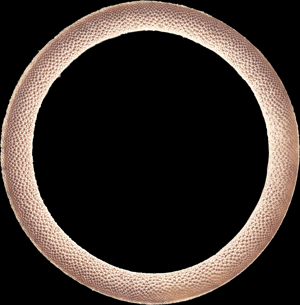

In [ ]:
df_fib = pd.read_csv(ring_fib_paths[0])
fig = plotRing(df_fib,ring_img_paths[0],300,caso)
fig.show()

In [ ]:
fd_path = f'/content/drive/MyDrive/Daniel_Thesis/05_Results/02_Fiber_Density/2_8_T_Fiber_Density_1.pdf'
fig.write_image(fd_path,width=700, height=450, scale=3)

In [ ]:
def plotRing(df_fib, img_path, resize=200, figureOpt=1):
    """
    generate a plotly figure of the fiber density behavior with the image of the ring
    :param figureOpt: 1 for clasic color lines, 2 for wide gray traces, 3 wide color traces.
    :param resize: the new size of the scan which is huge.
    :param df_fib: rings and wedges with fiber density results
    :param img_path: path of the scanned ring
    :return: plotly figure
    """
    df_fib['ddiff'] = [np.nan] * len(df_fib)
    for w in df_fib.wedge.unique():
        for r in df_fib.ring.unique():
            try:
                df_fib.loc[(df_fib.ring==r) &(df_fib.wedge==w),'ddiff'] = df_fib.loc[(df_fib.ring==r)&(df_fib.wedge==w),'density'].values[0] - df_fib.loc[(df_fib.ring==r-1)&(df_fib.wedge==w),'density'].values[0]
            except:
              pass
    df_fib.ddiff = df_fib.ddiff.abs()
    # diff_1 = []
    # for w in df_fib[df_fib.ring==1].wedge:
    #     try:
    #         diff_1.append(df_fib.loc[(df_fib.ring==2)&(df_fib.wedge==w),'ddiff'].values[0])
    #     except:
    #         diff_1.append(np.nan)
    # df_fib.loc[df_fib.ring==1,'ddiff'] = diff_1
    # df_fib.loc[df_fib.ring.isin([1,10])&(df_fib.ddiff>.18),'density'] = np.nan
    df_fib.loc[(df_fib.ring>df_fib.ring.max()/2)&(df_fib.ddiff>.18),'density'] = np.nan
    for i in range(1,int(df_fib.ring.max()/2)+1):
        w_list = df_fib[(df_fib.ring==i+1)&(df_fib.ddiff>.18)].wedge.unique()
        if len(w_list)>0:
            df_fib.loc[(df_fib.ring==i)&df_fib.wedge.isin(w_list),'density'] = np.nan
    
    df_fib.density = df_fib.density*100
    df_fib.rename(columns={'density': 'Density (%)', 'wedge': 'Wedge'}, inplace=True)
    df_fib['t (%)'] = df_fib.ring / df_fib.ring.max() * 100
    df_fib.dropna(subset=['Wedge','Density (%)'],inplace=True)

    fig = px.line(df_fib, x="t (%)", y="Density (%)", color='Wedge', template='plotly_white')

    if figureOpt == 1:
        pass
    elif figureOpt == 2:
        fig.update_traces(line=dict(color='darkgray', width=13), opacity=0.5)
        fig.update_layout(showlegend=False)
    elif figureOpt == 3:
        fig.update_traces(line=dict(width=10), opacity=0.5)
    else:
        raise Exception('Enter a valid figureOpt: 1, 2, 3')
    img = Image.open(img_path)
    img_size = img.size
    r = resize / img_size[0]
    img = img.resize((resize, int(img_size[1] * r)))
    fig.add_layout_image(
        dict(
            source=img,
            x=0.05,
            y=0.95,
        ))
    fig.update_layout_images(dict(
        xref="paper",
        yref="paper",
        sizex=0.30,
        sizey=0.30,
        xanchor="left",
        yanchor="top"
    ))
    fig.update_layout(yaxis_range=[0,100],xaxis_range=[0,100],yaxis_ticksuffix = "%",xaxis_ticksuffix = "%",
                      font_family='Times New Roman', margin=dict(l=5, r=10, t=10, b=5))
    return fig


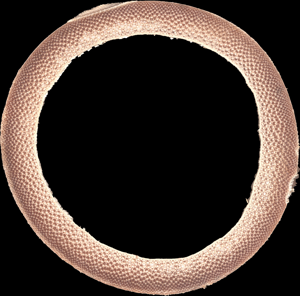

In [ ]:
fig

# Document

In [162]:
id = '3_20'
culm, internode = id.split('_')
culm = int(culm)
internode = int(internode)

## Properties table

In [163]:
printMatch(df_ring_prop.image_name,f'_{id}_')

33 T scans_3_20_T_cropped2_cleaned.jpg
72 B scans_3_20_B_cropped2_cleaned.jpg


In [164]:
getCProp(df_ring_prop,33,72,transverse=False)

\begin{tabular}{lrrrrrrrr}
\toprule
{} &  $OD (in)$ &  $ID (in)$ &  $t (in)$ &  $A (in^{2})$ &  $I_x (in^4)$ &  $I_y (in^4)$ &  $J (in^4)$ &  $F (\%)$ \\
\midrule
Top    &       2.04 &       1.61 &      0.22 &          1.25 &          0.53 &          0.52 &        1.05 &     40.81 \\
Bottom &       2.11 &       1.61 &      0.25 &          1.47 &          0.63 &          0.65 &        1.28 &     41.87 \\
\bottomrule
\end{tabular}



## Bow-tie Shear Test

In [7]:
def splitID(id):
    lista = [np.nan] * 3
    for i,s in enumerate(id.split('.')):
        lista[i] = int(s)
    return lista

In [8]:
df_bowtie[['culm','internode','subsection']] = [splitID(df_bowtie.ID[i]) for i in df_bowtie.index]

In [165]:
df_bt = getBowTieLatex(df_bowtie,culm,internode,return_df=True)

\begin{tabular}{lrrrrrl}
\toprule
\textbf{Sample} &  $t_{avg} (in)$ &  $l_{avg} (in)$ &  $A (in^2)$ &  $F (lb)$ &  $\tau_u (ksi)$ & $MC (\%)$ \\
\midrule
         3.19.1 &            0.22 &            2.26 &        2.01 &   5891.95 &            1.89 &     11.17 \\
         3.19.2 &            0.22 &            2.27 &        1.97 &   3283.87 &            1.68 &     11.25 \\
         3.19.3 &            0.21 &            2.23 &        1.90 &   3048.53 &            1.61 &     11.98 \\
         3.19.4 &            0.20 &            2.26 &        1.81 &   4385.61 &            2.43 &     10.89 \\
\bottomrule
\end{tabular}



## OD diameters

In [166]:
getODLatex(df_diameters, culm, internode, False)

MC: 11.2 %
Date: 10/12/2022 0:44
\begin{tabular}{lrrrrrr}
\toprule
{} &  1 N-S &  1 E-W &  2 N-S &  2 E-W &  3 N-S &  3 E-W \\
\midrule
$OD (in)$ &   2.19 &   2.15 &   2.17 &   2.10 &   2.13 &   2.06 \\
\bottomrule
\end{tabular}



## $\tau$ vs $\gamma$

In [11]:
paths = glob.glob('/content/drive/MyDrive/Daniel_Thesis/05_Results/00_Preliminar Analysis/*.csv')

In [12]:
def get_df_merged(paths,culm,internode):
    for path in paths:
        bn = os.path.basename(path)
        if f'{culm}_{internode}_' in bn[:6]:
            df = pd.read_csv(path)
            df.datetime = pd.to_datetime(df.datetime)
            return df

In [167]:
df = get_df_merged(paths,culm,internode)

In [168]:
px.line(df,'datetime','MS-3k-S_Loadcell (Resampled)')

In [169]:
df_bt['$\tau_u (ksi)$'].median()

1.7827444999999997

In [170]:
start_time = '2022-10-12 01:01:20'
end_time = '2022-10-12 01:03:11'#[df['$\\gamma_{DIC}$']>-0.003]
fig, G = ODR_results(df,start_time,end_time,min_max=(.10,.7), tau_bt = 1.78, colors = ['black','dodgerblue']) # colors = px.colors.cyclical.Edge[0:]

In [ ]:
fig.update_layout(xaxis_range=[-0.003,0.025])

In [171]:
strain_stress = f'/content/drive/MyDrive/Daniel_Thesis/05_Results/01_Strain_Stress_pdfs/00_400x300/{id}_Strain_Stress.pdf'
fig.write_image(strain_stress, width=400, height=300, scale=3)

In [172]:
G 

[167.2127050760068, 194.11315548143364]

In [173]:
df.loc[(df.datetime>pd.to_datetime(end_time)-pd.to_timedelta(10,'s'))&(df.datetime<pd.to_datetime(end_time)+pd.to_timedelta(10,'s')),'$\\tau (ksi)$'].max()

2.242316060641322